<h2>Import Libraries</h2>

In [1]:
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler, RobustScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.mixture import GaussianMixture as GMM
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
from kneed import KneeLocator
from pyclustering.cluster.clarans import clarans
from pyclustering.cluster.silhouette import silhouette
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.kmeans import kmeans

<h2>Prepare Dataset</h2>

In [2]:
# Load dataset
df = pd.read_csv('./housing.csv')

# Drop missing values
df.dropna(axis = 'rows', inplace = True)

# Delete unnecessary attribute
df.drop('median_house_value', axis = 'columns', inplace = True)

# Label encoding for categorial attribute
l_er = LabelEncoder()
df['ocean_proximity'] = l_er.fit_transform(df['ocean_proximity'])

<h2>Find various combinations of the features</h2>
<h5>using Pearson Correlation of features</h5>

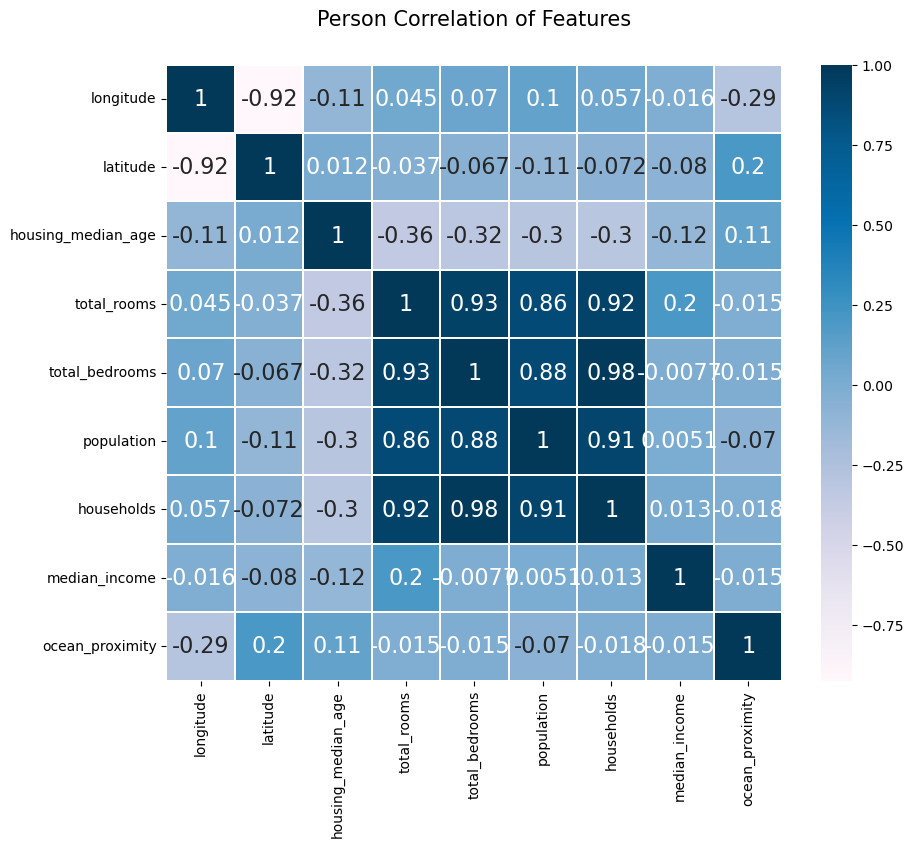

In [3]:
# find various combinations of the features using Pearson Correlation of features
colormap = plt.cm.PuBu

plt.figure(figsize=(10, 8))
plt.title("Person Correlation of Features", y = 1.05, size = 15)
sns.heatmap(df.astype(float).corr(), linewidths = 0.1, vmax = 1.0, square = True, cmap = colormap, linecolor = "white", annot = True, annot_kws = {"size" : 16})

plt.show()

<h2>Make Models</h2

In [7]:
def kmeans_silhouette_eblow(cluster_lists, X_features, scaler):
    # Clear the result array
    sse.clear()
    silhouette_avg_n_clusters.clear()

    n_cols = len(cluster_lists)

    # Prepare subplots
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)
    fig.subplots_adjust(top=0.8)

    # Repeat with given number of cluster in list
    for ind, n_cluster in enumerate(cluster_lists):

        # Calculate silhouette score after KMeans clustering
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0)
        cluster_labels = clusterer.fit_predict(X_features)
        sse.append(clusterer.inertia_)
        print('[Running] : {:.2f}%'.format(n_cluster/len(cluster_lists)*50))

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)
        silhouette_avg_n_clusters.append(sil_avg)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        # Visualize using bar graph, for each cluster number
        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")
    plt.suptitle(scaler, fontsize=12, fontweight='bold', y=0.98)
    plt.show()

    # Call functions to draw elbow plot and Kmeans result
    elbowPlot(scaler)
    K_means_plot(X_features, range(2, 11, 2), scaler)

def elbowPlot(scaler):
    kl = KneeLocator(
        range(2, 11, 2), sse, curve="convex", direction="decreasing"
    )
    kl.plot_knee()
    plt.title(scaler)
    plt.show()

    print('elbow:', kl.elbow)

def K_means_plot(dataset, cluster_lists, scaler):
    # PCA
    pca = PCA(2)
    dataset = pca.fit_transform(dataset)

    n_cols = len(cluster_lists)

    # Prepare subplots
    fig, axs = plt.subplots(figsize=(4 * n_cols, 4), nrows=1, ncols=n_cols)
    fig.subplots_adjust(top=0.8)

    for ind, n_cluster in enumerate(cluster_lists):
        model = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0)
        km_labels = model.fit_predict(dataset)
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n')

        # Plot the input data
        u_labels = np.unique(km_labels)
        centroids = model.cluster_centers_
        for i in u_labels:
            axs[ind].scatter(dataset[km_labels == i, 0], dataset[km_labels == i, 1], label=i)

        # Labeling the clusters
        # Draw white circles at cluster centers
        axs[ind].scatter(centroids[:, 0], centroids[:, 1], marker='o',
                    c="white", alpha=1, s=100, edgecolor='k')
        for i, c in enumerate(centroids):
            axs[ind].scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=25, edgecolor='k')
    plt.suptitle(scaler, fontsize=12, fontweight='bold', y=0.98)
    plt.show()

def gmm_cluster(dataset, scaler):
    # PCA
    pca = PCA(2,whiten=True)
    dataset = pca.fit_transform(dataset)

    # Define & Fit model
    n_components = np.arange(50, 210, 10)
    models = [GMM(n, covariance_type='full', random_state=0) for n in n_components]
    aics = [model.fit(dataset).aic(dataset) for model in models]

    # Plot the AIC score
    plt.plot(n_components, aics)
    plt.ylabel('AIC')
    plt.xlabel('Number of Components')
    plt.title('AIC for the number of GMM components')
    plt.axhline(y=min(aics), color="red", linestyle="--")
    plt.show()

    # Define & Fit model
    gmm = GMM(n_components[aics.index(min(aics))],covariance_type='full', random_state=0)
    gmm.fit(dataset)
    print('{} / {} Converged : {}'.format(scaler, n_components[aics.index(min(aics))], gmm.converged_))

    # Calculate silhoutte score
    gmm_silhouette(range(2,11,2), dataset, scaler)

    # Plot GMM result
    plot_gmm(gmm, dataset)
    plt.title('{} \ GMM Clustering with n_components :{}'.format(scaler, gmm.n_components))
    plt.show()

def gmm_silhouette(cluster_lists, X_features, scaler):
    # Clear the result array
    sse.clear()
    silhouette_avg_n_clusters.clear()

    n_cols = len(cluster_lists)

    # Prepare subplots
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)
    fig.subplots_adjust(top=0.8)

    # Repeat with given number of cluster in list
    for ind, n_cluster in enumerate(cluster_lists):

        # Calculate silhouette score after GMM clustering
        clusterer = GMM(n_components = n_cluster, max_iter=500, random_state=0)
        cluster_labels = clusterer.fit_predict(X_features)

        print('[Running] : {:.2f}%'.format(n_cluster/len(cluster_lists)*50))

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)
        silhouette_avg_n_clusters.append(sil_avg)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        # Visualize using bar graph, for each cluster number
        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")
    plt.suptitle(scaler, fontsize=12, fontweight='bold', y=0.98)
    plt.show()

def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=10, cmap=plt.cm.get_cmap('rainbow', 200), zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')

def clustering_clarans(select_df):
    sil_clarans = []
    visualizer = cluster_visualizer(10, 4)

    wce=[]

    # Calculate elbow wce
    def elbow_cal_wce():
        centers=select_df[df_medoids] # center
        instance = kmeans(select_df, centers, ccore=False) # cluster with center
        instance.process()
        wce.append(instance.get_total_wce())

    # Calculate distance using elbow wce
    def cal_elbows():
        __elbows = []
        x0, y0 = 0.0, wce[0]
        x1, y1 = float(len(wce)), wce[-1]

        for index_elbow in range(1, len(wce) - 1):
            x, y = float(index_elbow), wce[index_elbow]

            segment = abs((y0 - y1) * x + (x1 - x0) * y + (x0 * y1 - x1 * y0))
            norm = math.sqrt((x1 - x0) ** 2 + (y1 - y0) ** 2)
            distance = segment / norm

            __elbows.append(distance)
        return __elbows

    # For given k
    for k in range(2, 11, 2):
        df_clarans = clarans(select_df[0:200], k, 3, 5)
        df_clarans.process()
        df_medoids = df_clarans.get_medoids() # center
        df_cluster = df_clarans.get_clusters() # cluster
        score = silhouette(select_df, df_cluster).process().get_score() # silhouette score
        sil_clarans.append(np.nanmean(score)) # store result

        elbow_cal_wce()

        if len(select_df[0])!=4: # Dismiss 4-dimensional
            visualizer.append_clusters(df_cluster, select_df,k-2) # Visualize cluster
            visualizer.append_cluster(df_medoids, select_df,k-2, marker='x') # Visualize center
            visualizer.set_canvas_title(text="Clarans Cluster : " + str(k), canvas=k-2)

    if len(select_df[0]) != 4:  # Dismiss 4-dimensional
        visualizer.show(figure=plt.figure(figsize=(8,6)))

    print("Clarans Silhouette Best score : "+str(np.max(sil_clarans)))
    print("Clarans Silhouette Best cluster : " + str(np.argmax(sil_clarans)+3))
    plt.title('Clarans Silhouette')
    plt.plot(range(2, 11, 2), sil_clarans)
    plt.show()

    print("Clarans Best cluster's Elbow WCE : " + str(wce[np.argmax(sil_clarans)]))  # Best cluster's elbow wce
    plt.title('Clarans Elbow WCE')
    plt.plot(range(2, 11, 2), wce)
    plt.show()

    _elbow = cal_elbows()
    plt.title('Clarans Elbow Distance')
    plt.plot(range(2, 7, 2), _elbow)
    plt.show()
    wce = []

def findOptimalNClustersDB(dataset):
    # Number of clusters to search for and silhouette_scores list
    range_eps = [0.01, 0.05, 0.1]
    silhouette_avg.clear()

    fig, axs = plt.subplots(figsize=(4 * 5, 4), nrows=1, ncols=len(range_eps))
    fig.subplots_adjust(top=0.8)

    # Testing n_clusters options
    for ind, eps in enumerate(range_eps):
        # print(j, n_clusters, k, eps)
        db = DBSCAN(eps=eps, n_jobs=-1)
        cluster = db.fit(dataset)

        db_labels = db.fit_predict(dataset)
        u_labels = np.unique(cluster.labels_)
        print(db_labels)
        sil_avg = silhouette_score(dataset, db_labels)
        for l in u_labels:
            axs[ind].scatter(dataset[db_labels == l, 0], dataset[db_labels == l, 1], label=l)

        axs[ind].set_title('DBSCAN with eps {}\n'
                            'Silhouette score : {:.4f}'.format(eps, sil_avg))
        axs[ind].legend([], [], frameon=False)

        silhouette_avg.append(sil_avg)
        print('Silhouette Coefficient: {:.4f}'.format(sil_avg))
    plt.suptitle('{}/{}'.format(i, j), fontsize=14, fontweight='bold', y=0.98)
    plt.show()

    plt.plot(range_eps, silhouette_avg)
    plt.title('Silhouette Score for the number of each eps')
    plt.xlabel('eps')
    plt.ylabel('silhouette score')
    plt.show()

# Initialize lists to save result
sse = []
silhouette_avg_n_clusters = []
silhouette_avg = []

<h2>Get result</h2>

----------------['total_rooms', 'total_bedrooms']------------
----------------StandardScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


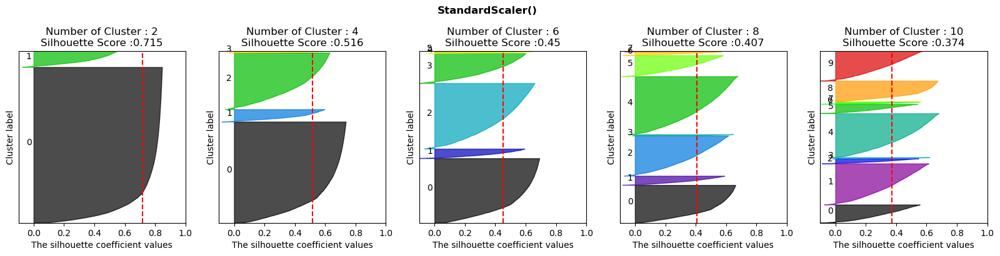

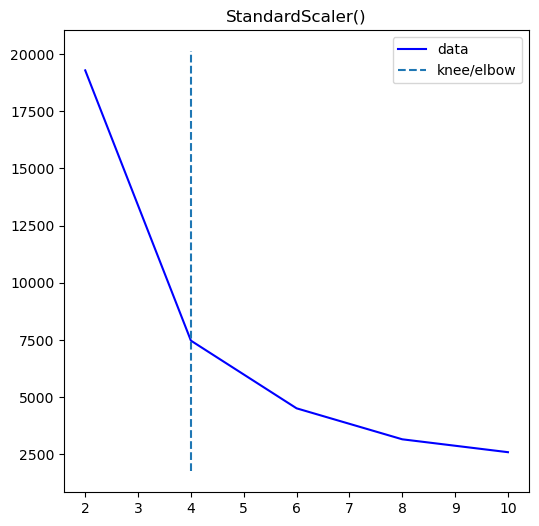

elbow: 4


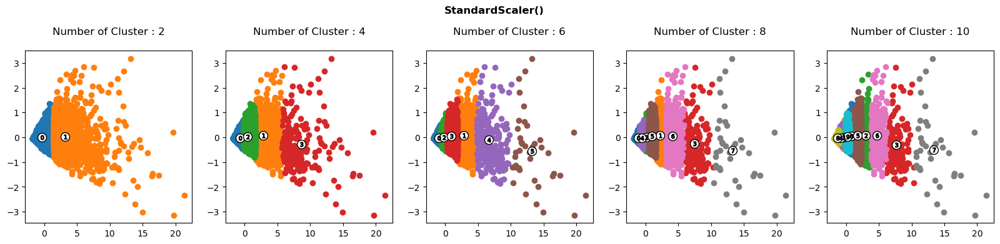

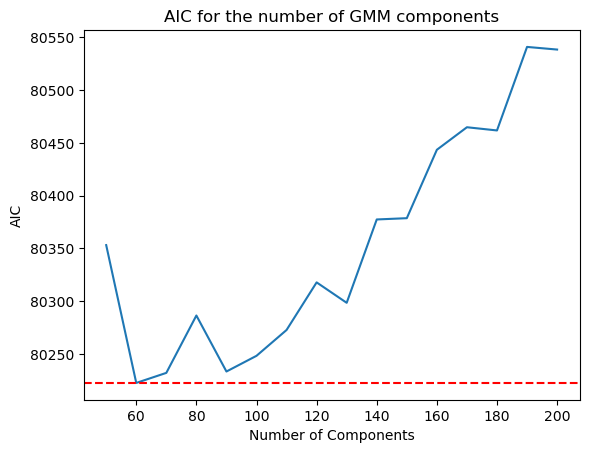

StandardScaler() / 60 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


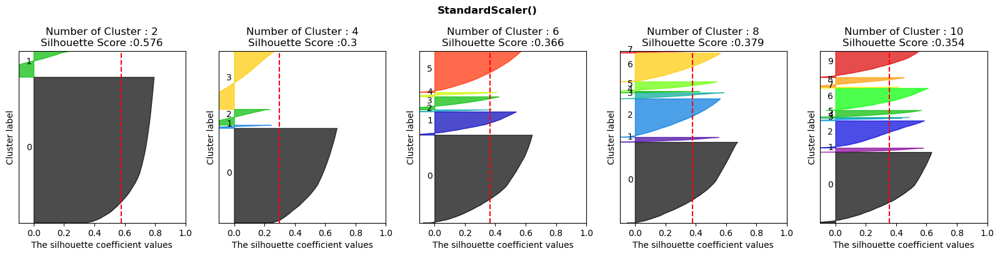

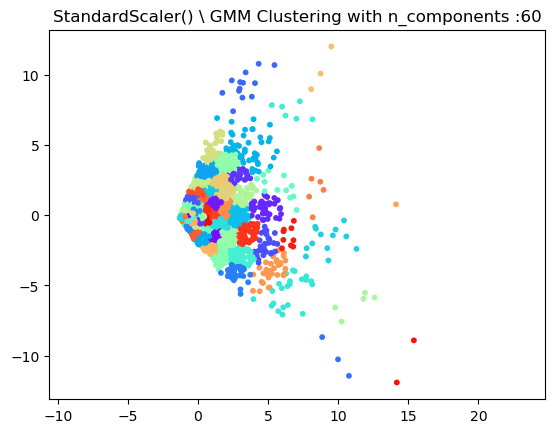

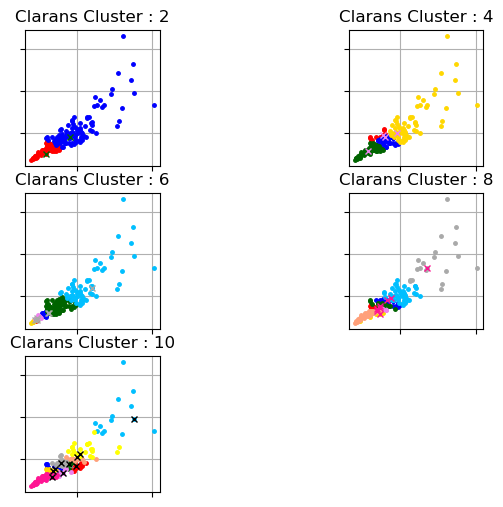

Clarans Silhouette Best score : 0.32045755081811444
Clarans Silhouette Best cluster : 3


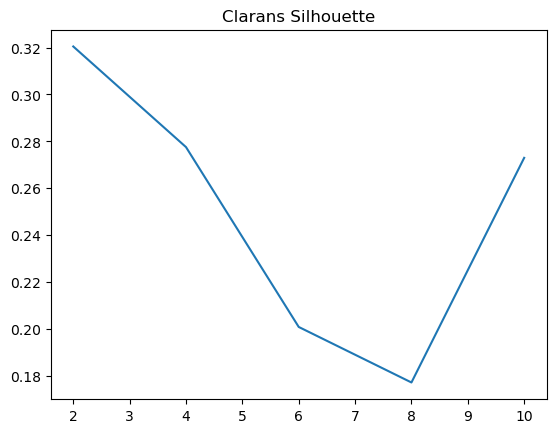

Clarans Best cluster's Elbow WCE : 19289.728395794507


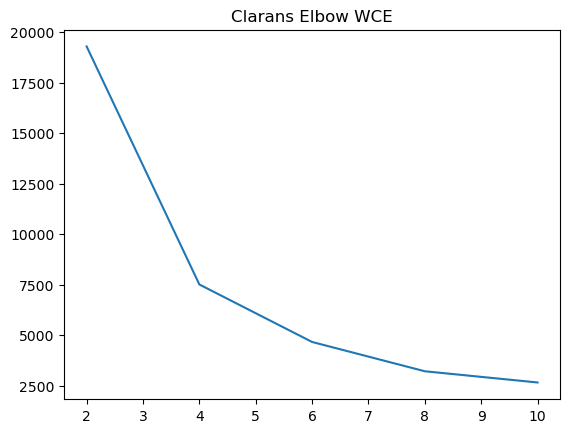

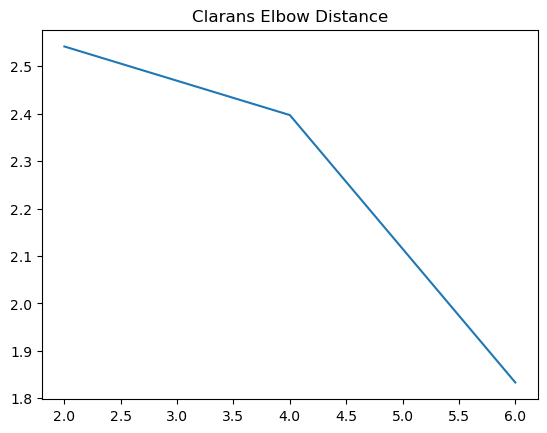

[ 0 -1 -1 ...  1  1 15]
Silhouette Coefficient: -0.6120
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.3271
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.1530


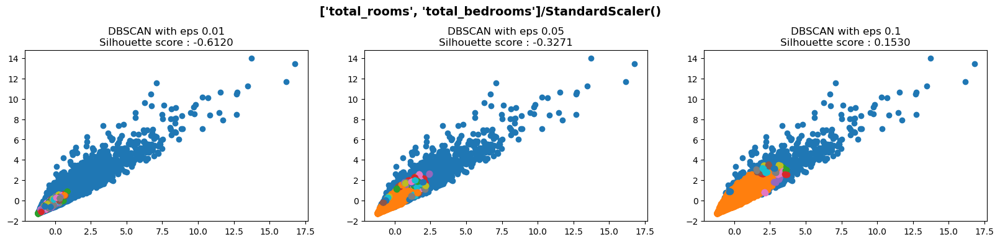

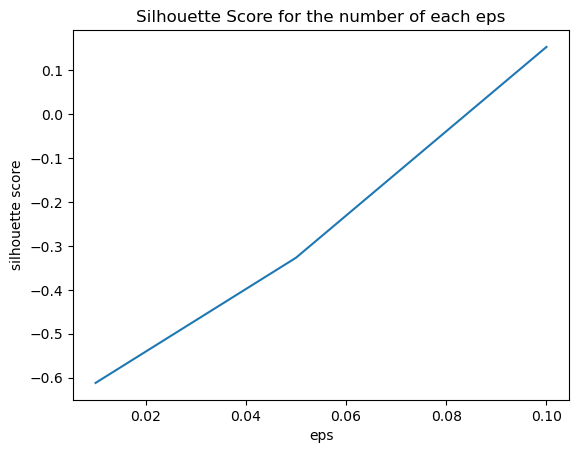

----------------MaxAbsScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


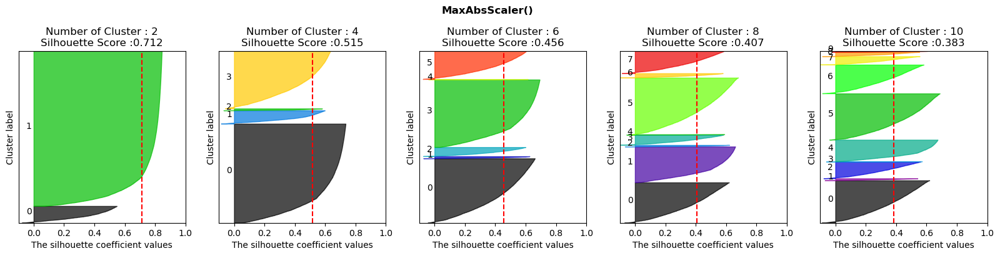

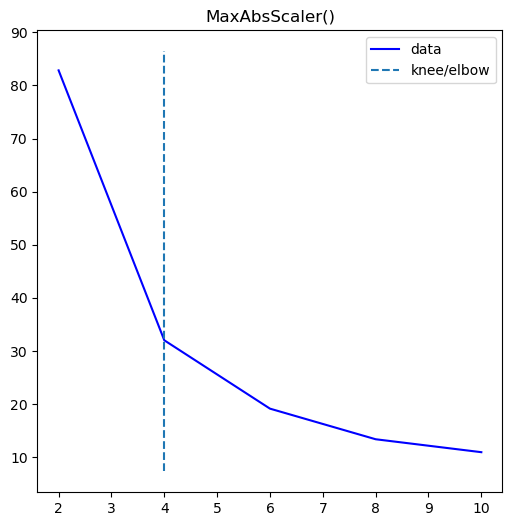

elbow: 4


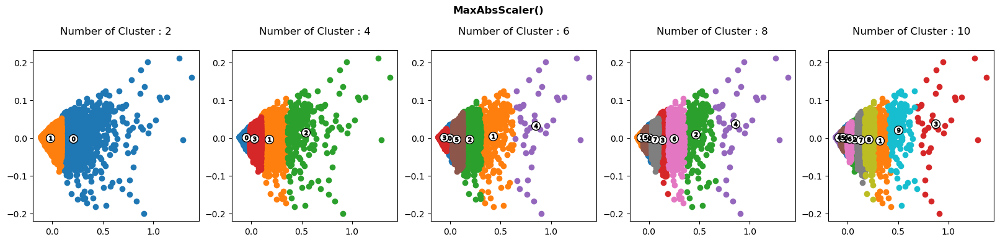

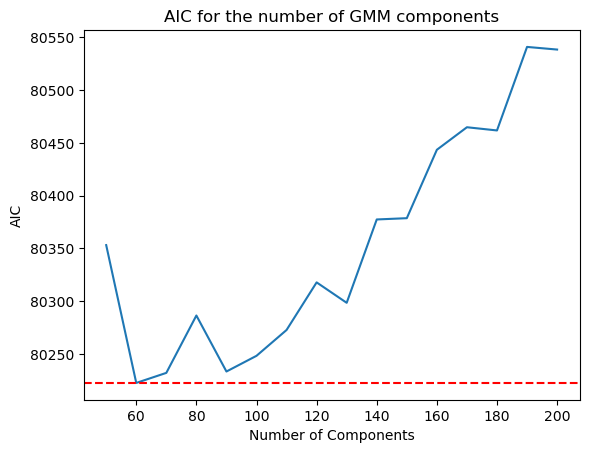

MaxAbsScaler() / 60 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


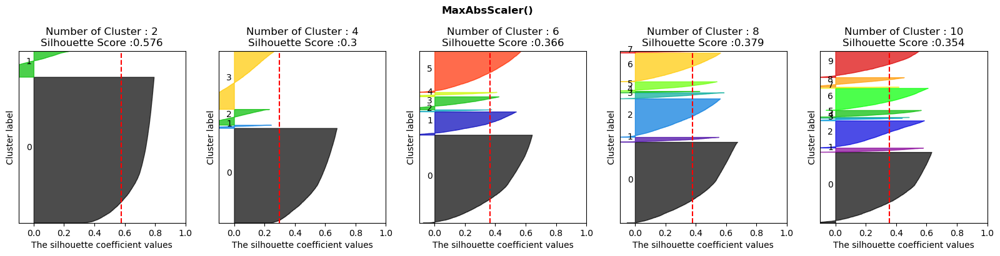

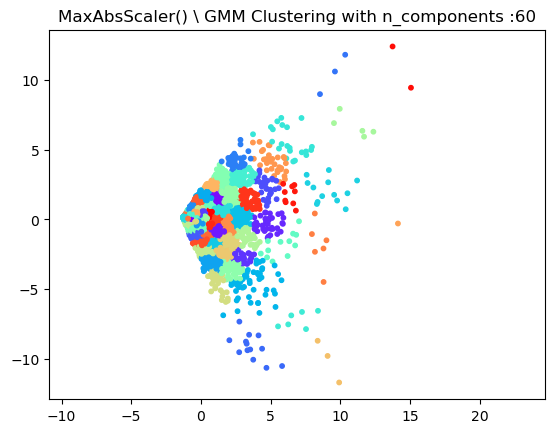

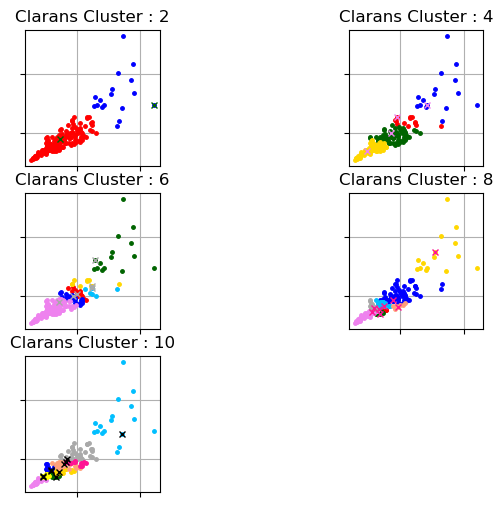

Clarans Silhouette Best score : 0.8773019007309185
Clarans Silhouette Best cluster : 3


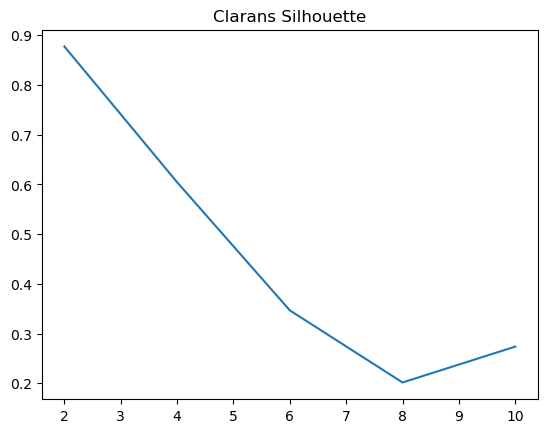

Clarans Best cluster's Elbow WCE : 83.67097468375586


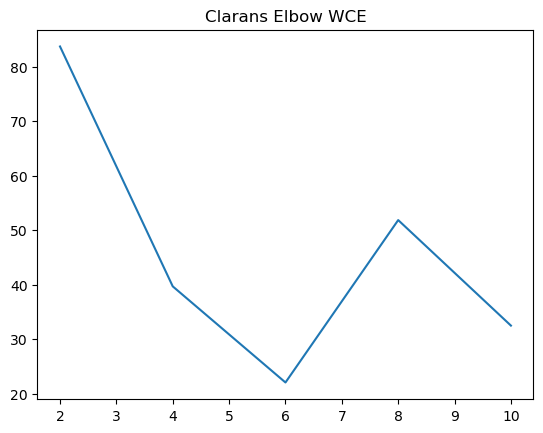

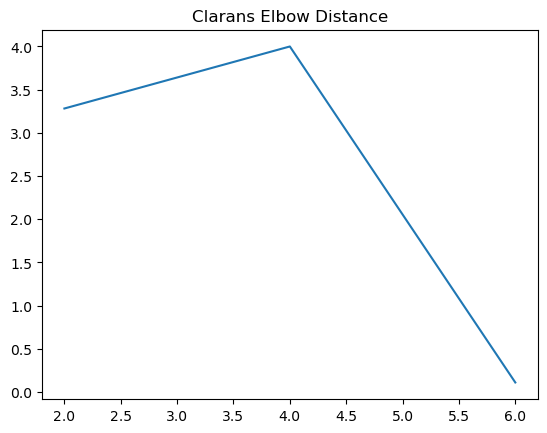

[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.6116
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8973
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.9245


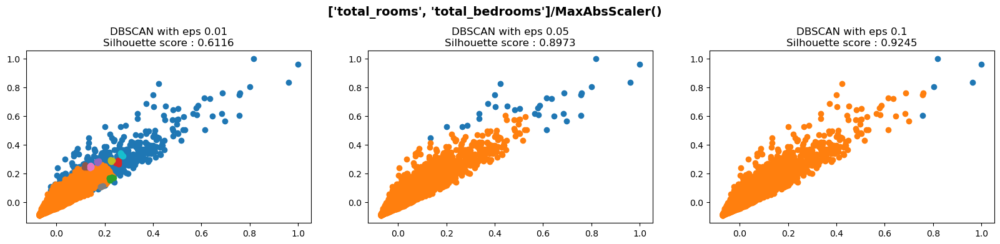

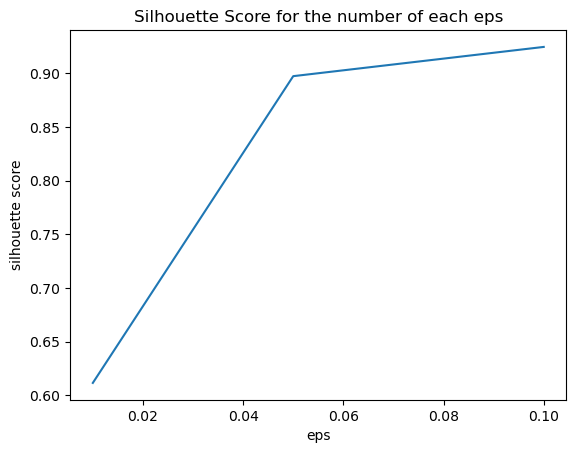

----------------MinMaxScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


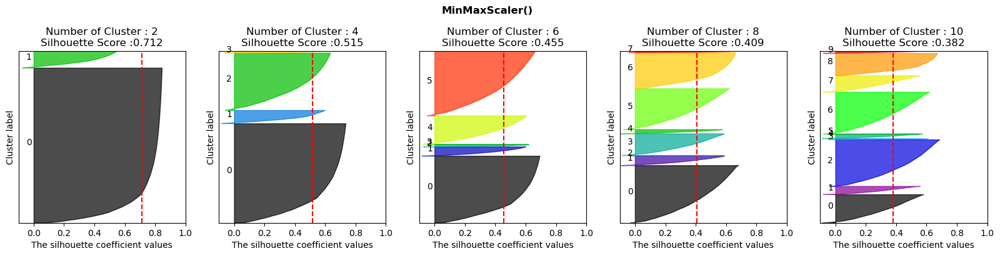

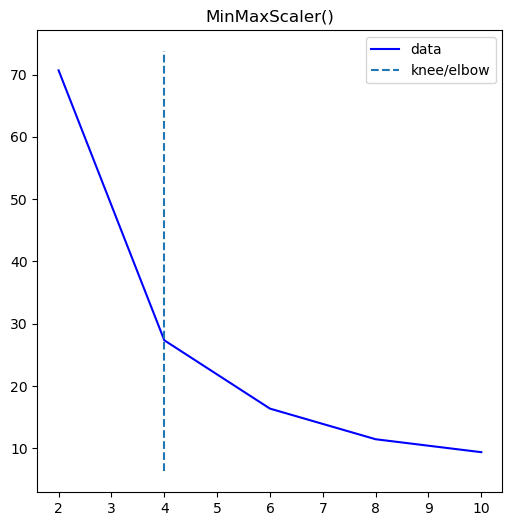

elbow: 4


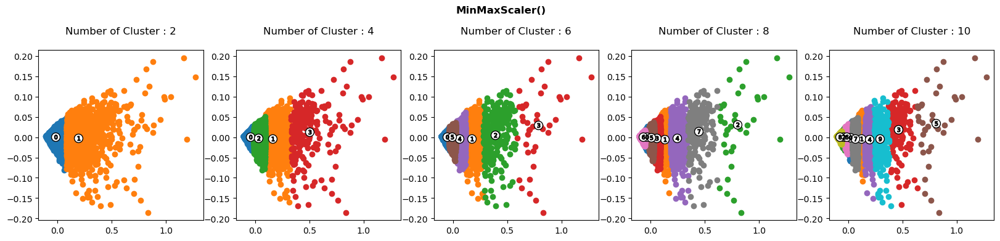

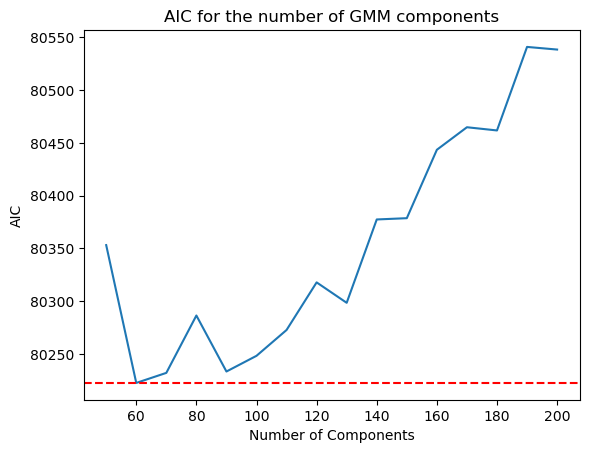

MinMaxScaler() / 60 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


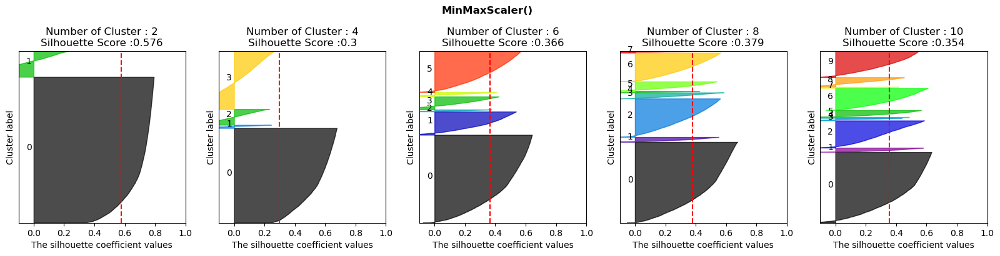

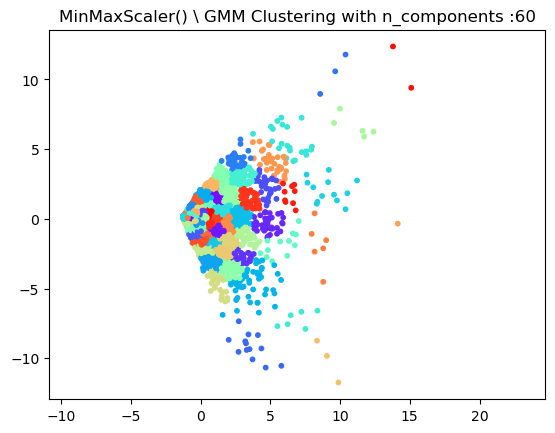

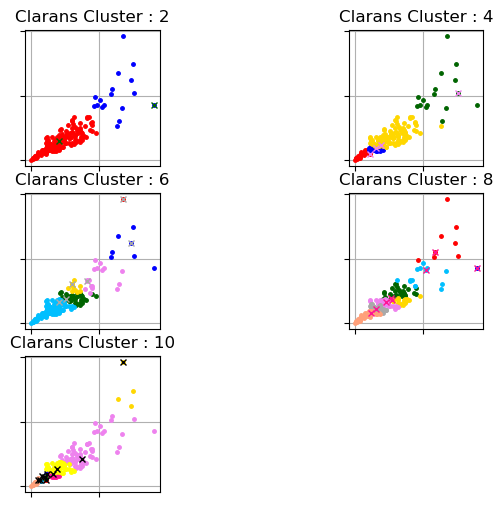

Clarans Silhouette Best score : 0.8770905002111138
Clarans Silhouette Best cluster : 3


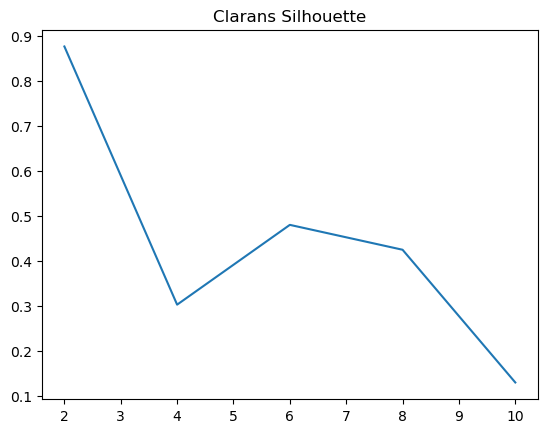

Clarans Best cluster's Elbow WCE : 71.57297858006733


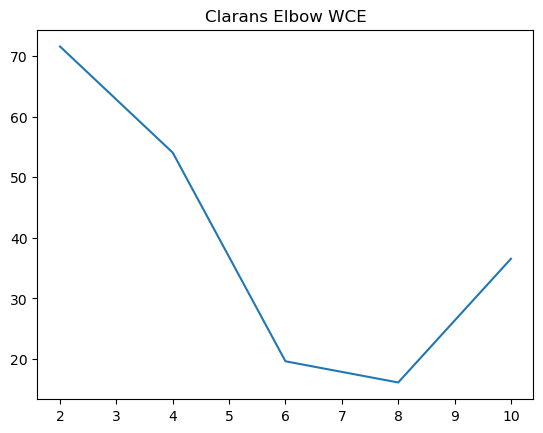

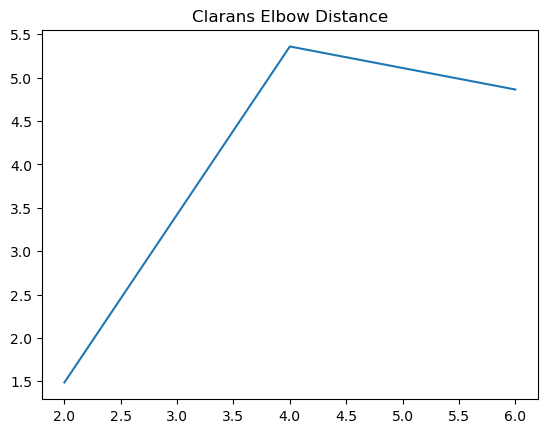

[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.6828
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8974
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.9284


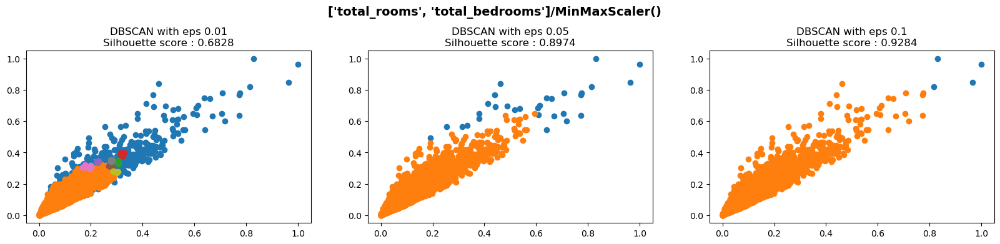

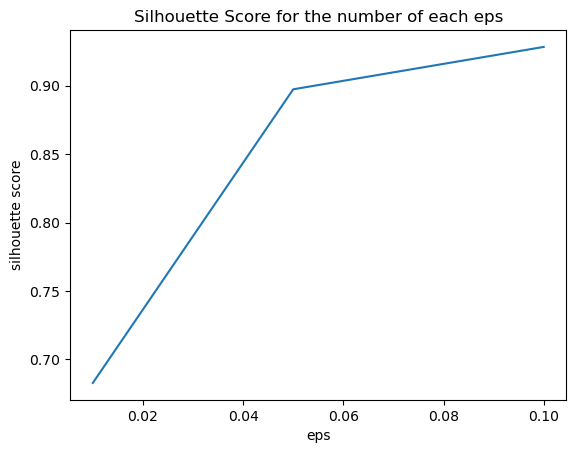

----------------RobustScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


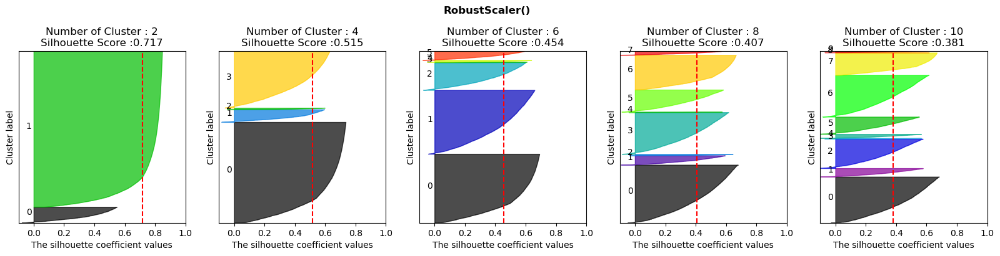

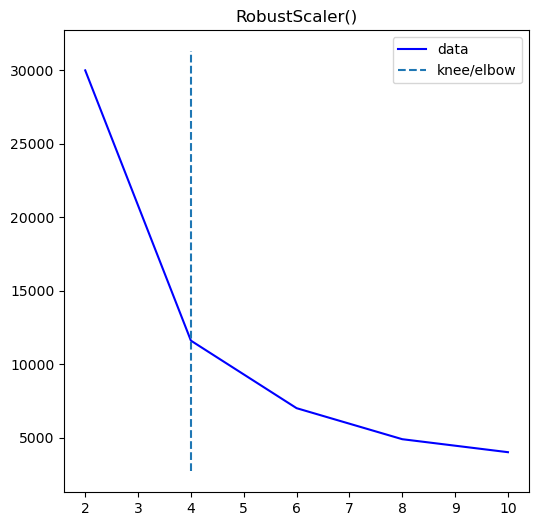

elbow: 4


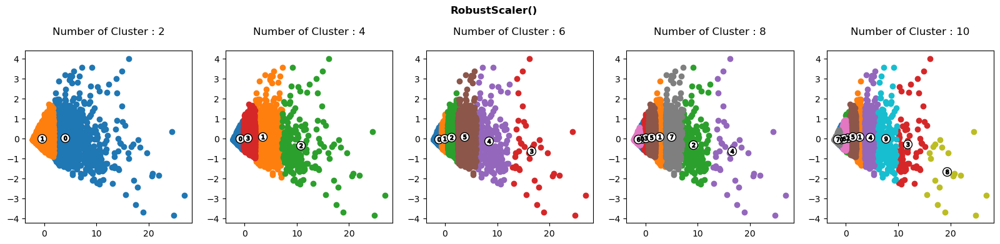

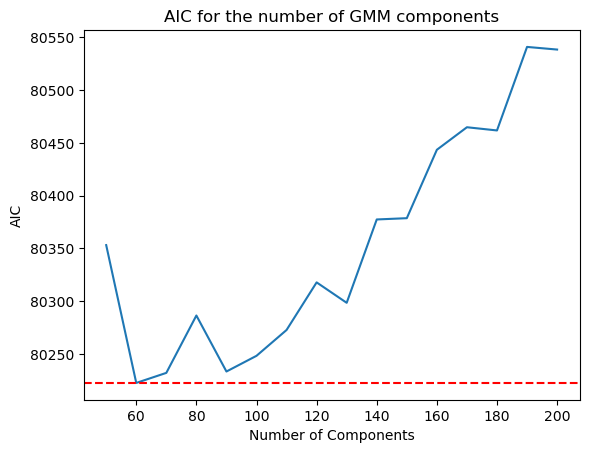

RobustScaler() / 60 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


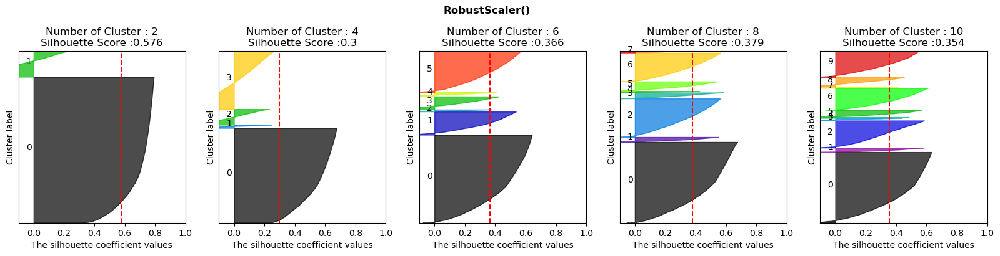

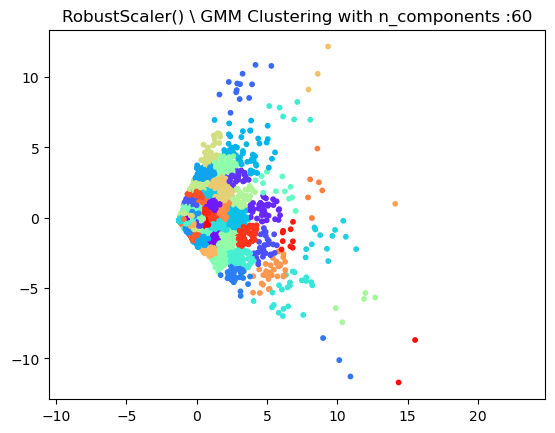

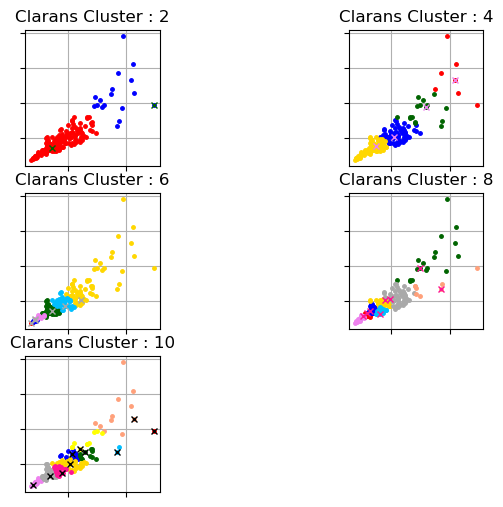

Clarans Silhouette Best score : 0.8734256395002806
Clarans Silhouette Best cluster : 3


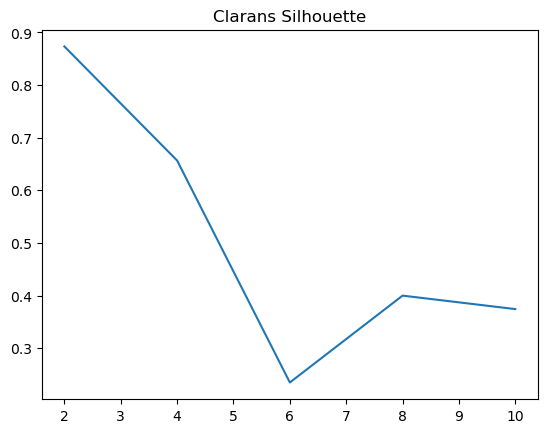

Clarans Best cluster's Elbow WCE : 29998.777747544045


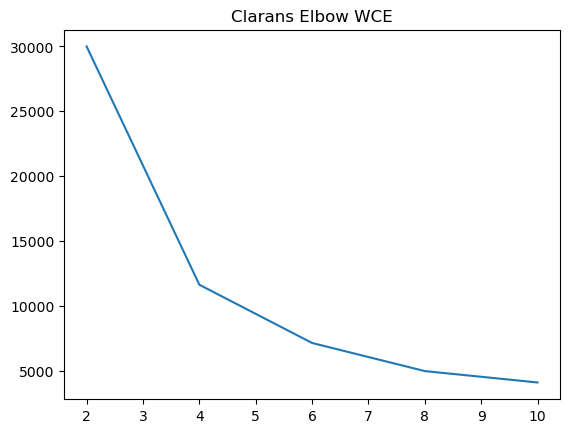

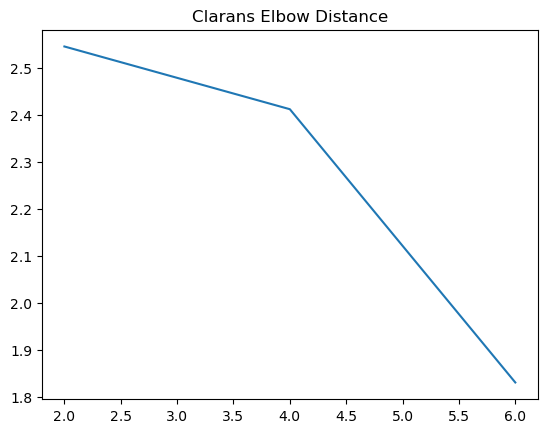

[ -1  -1  -1 ... 171   0  -1]
Silhouette Coefficient: -0.5044
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.1640
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.4070


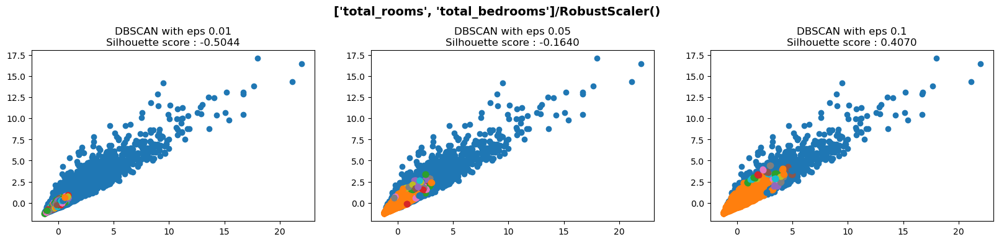

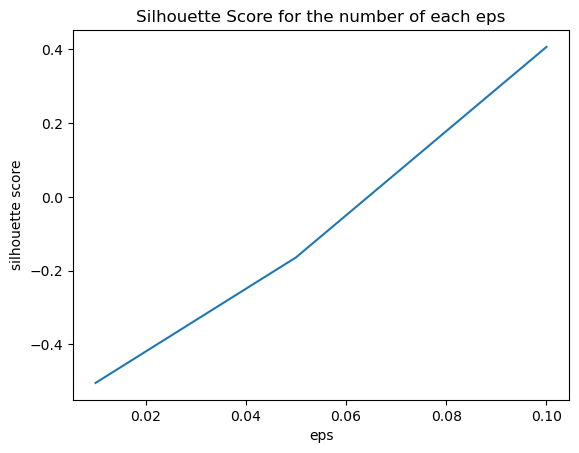

----------------['population', 'households']------------
----------------StandardScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


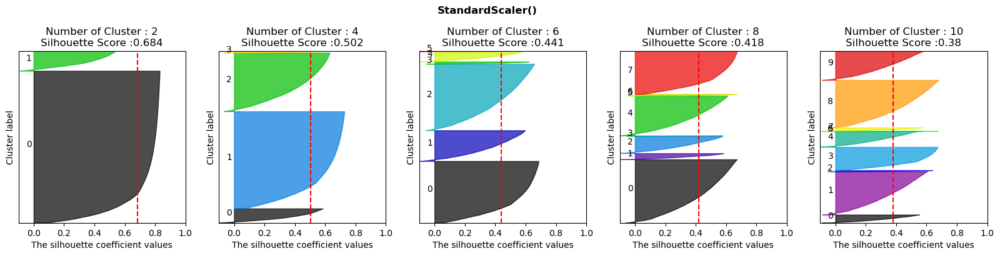

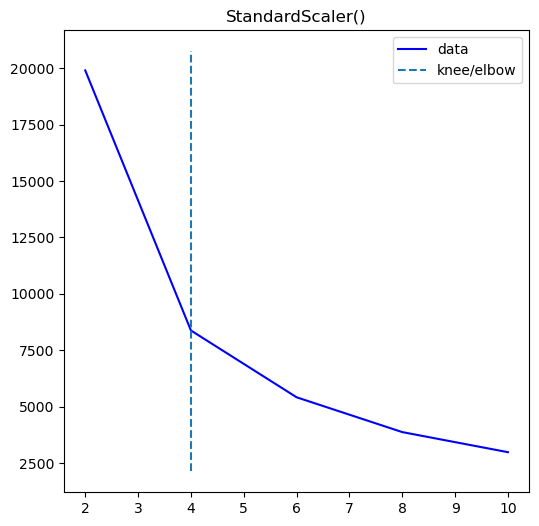

elbow: 4


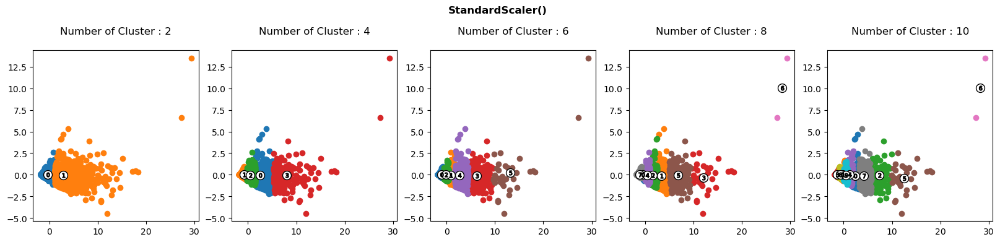

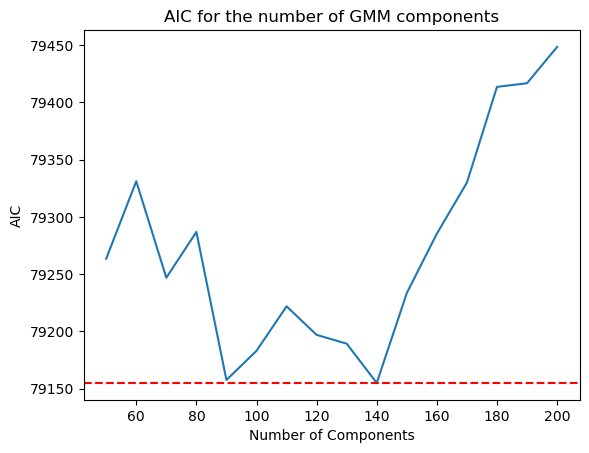

StandardScaler() / 140 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


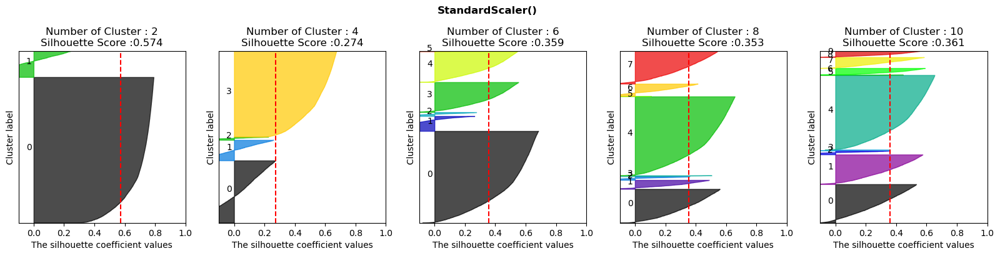

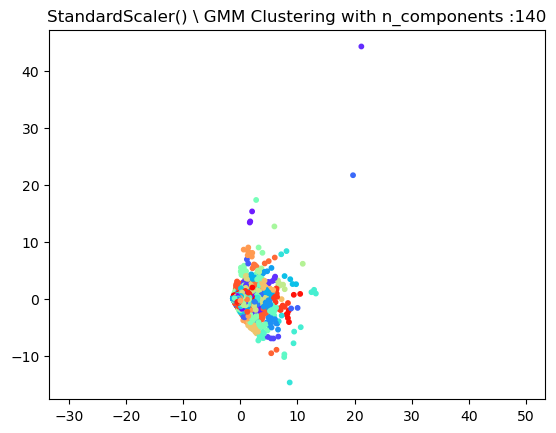

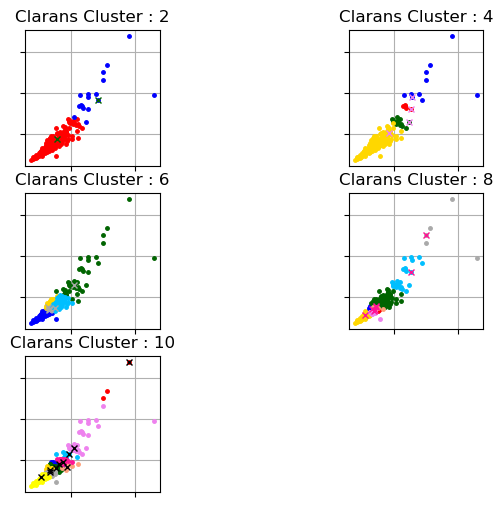

Clarans Silhouette Best score : 0.879494951715177
Clarans Silhouette Best cluster : 3


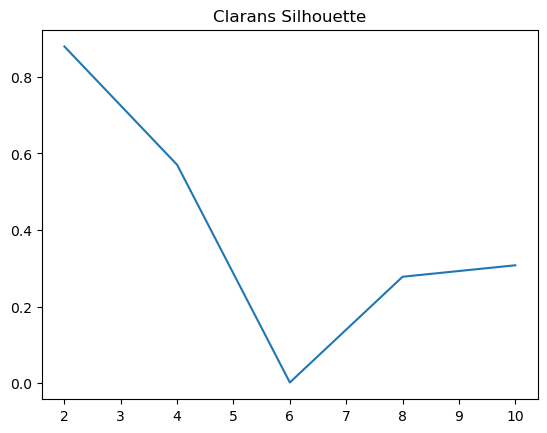

Clarans Best cluster's Elbow WCE : 19901.82981371656


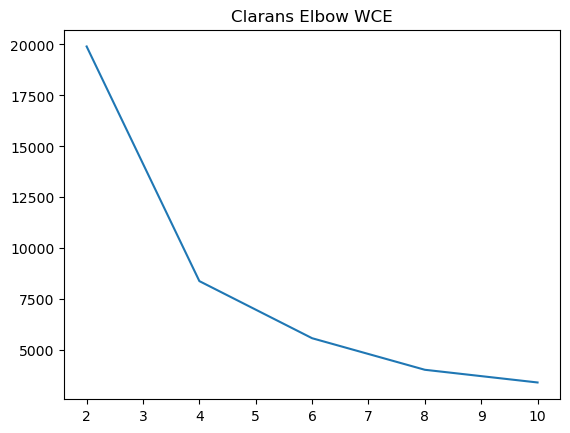

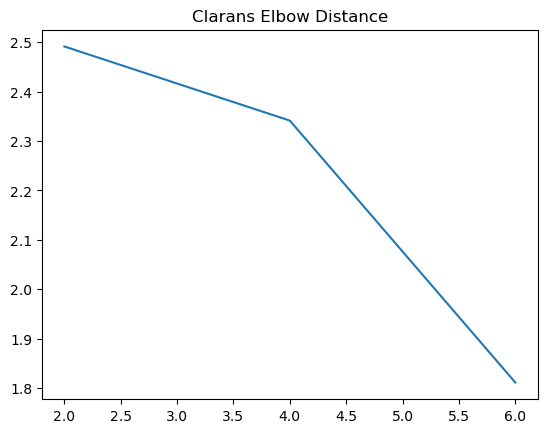

[  0  -1   0 ...  42   2 140]
Silhouette Coefficient: -0.6018
[0 1 0 ... 0 0 0]
Silhouette Coefficient: 0.2035
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.4006


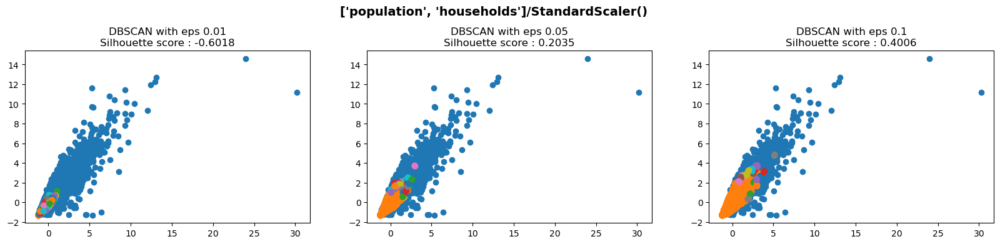

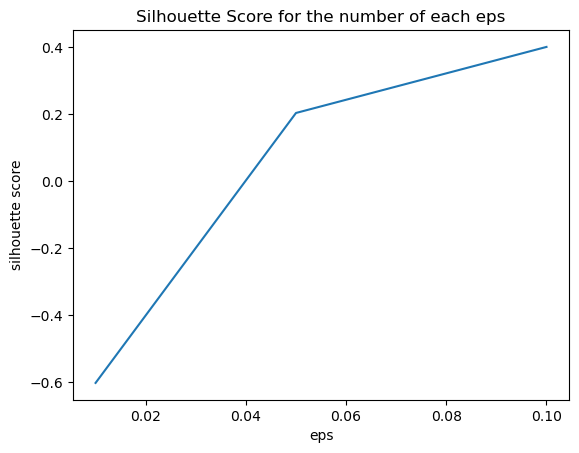

----------------MaxAbsScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


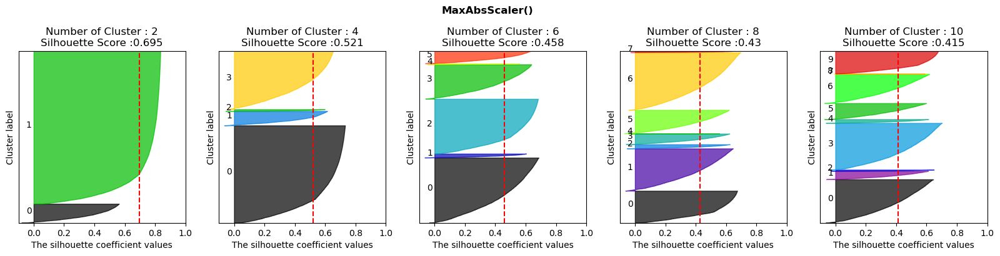

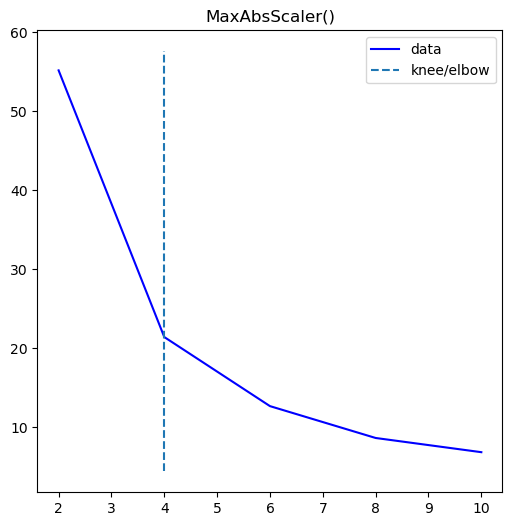

elbow: 4


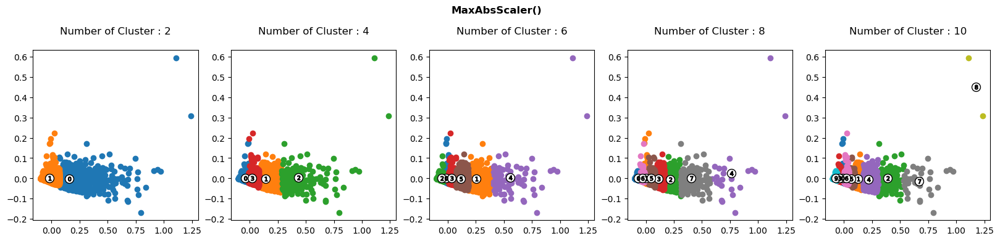

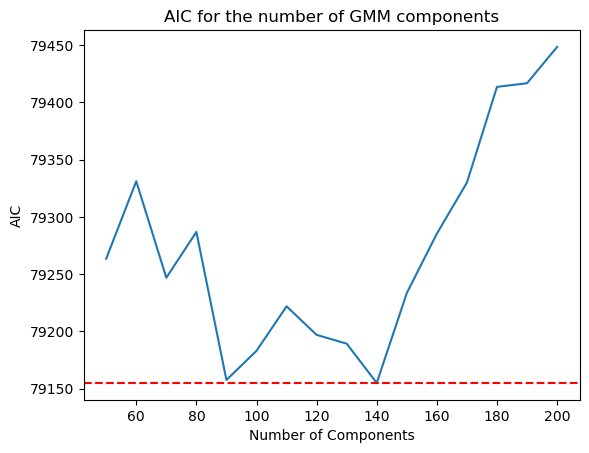

MaxAbsScaler() / 140 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


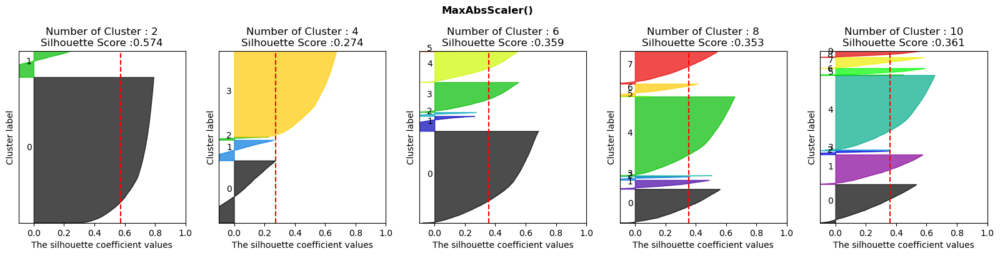

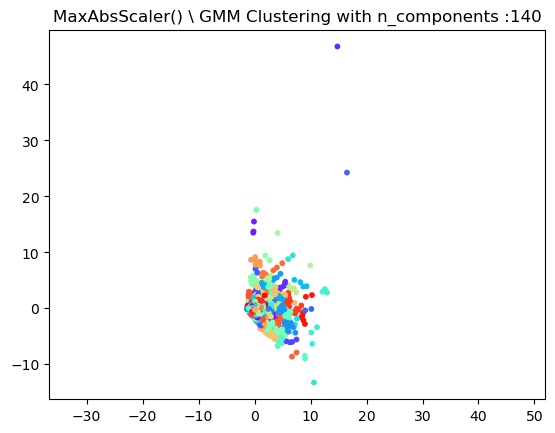

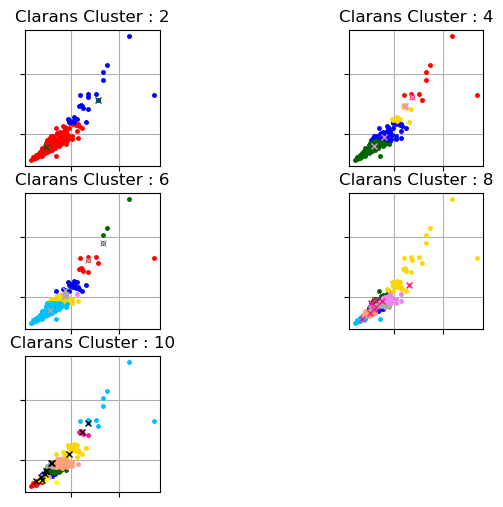

Clarans Silhouette Best score : 0.8489469570861061
Clarans Silhouette Best cluster : 3


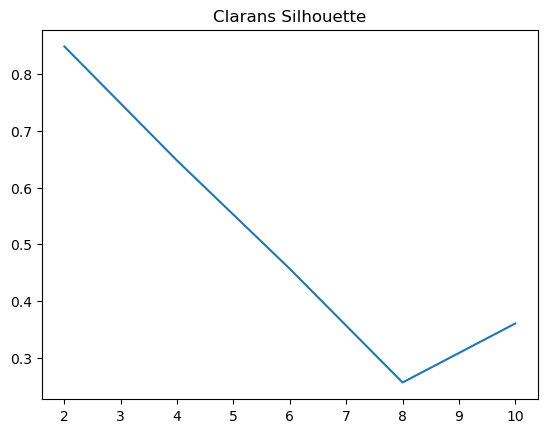

Clarans Best cluster's Elbow WCE : 57.621367278730695


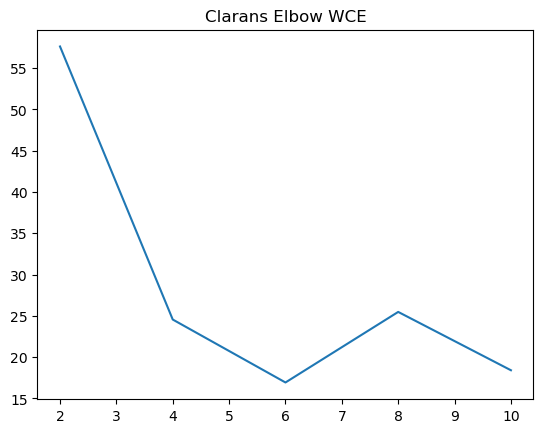

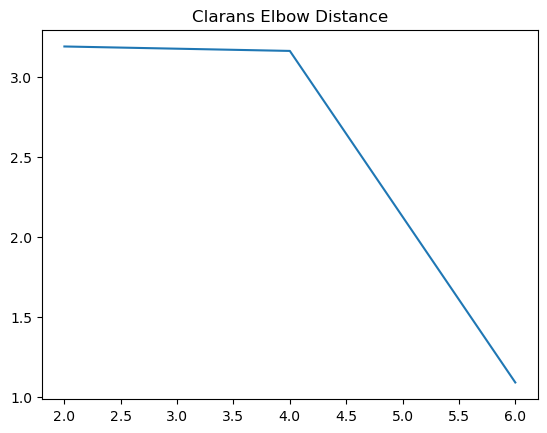

[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.6773
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8908
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.9302


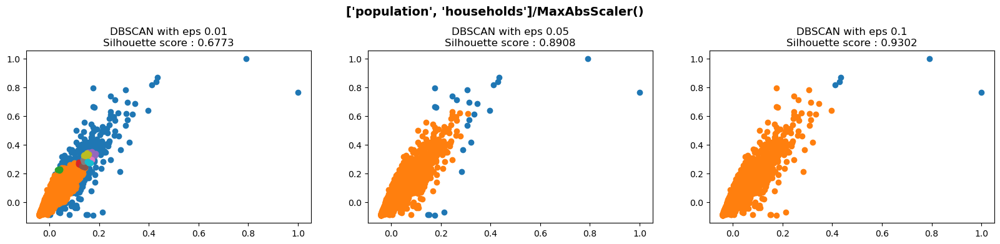

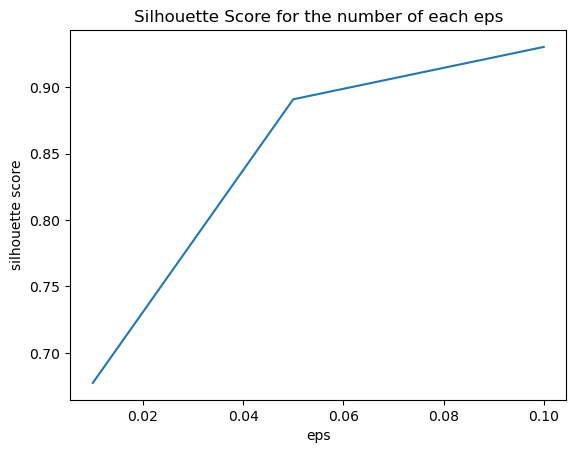

----------------MinMaxScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


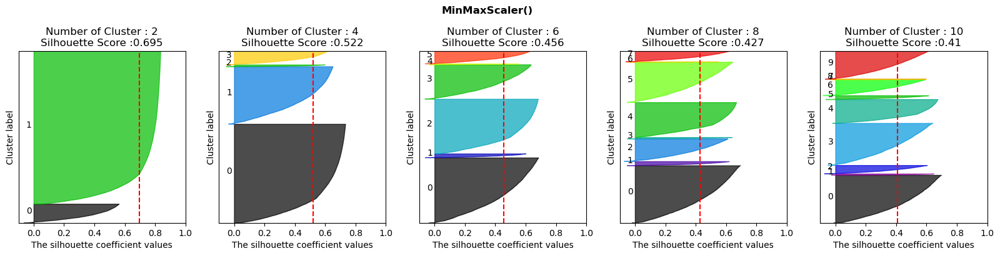

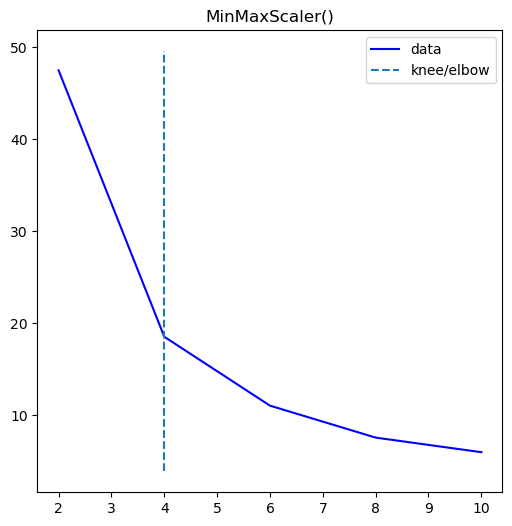

elbow: 4


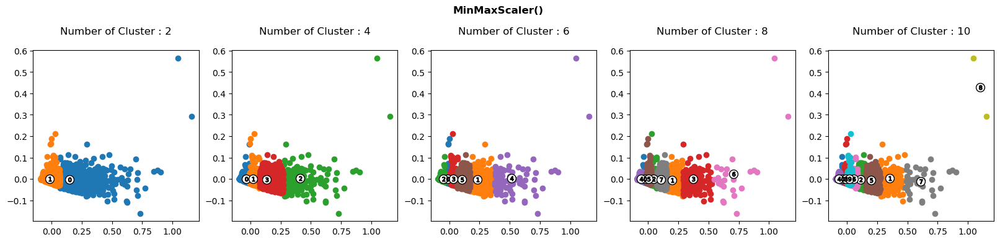

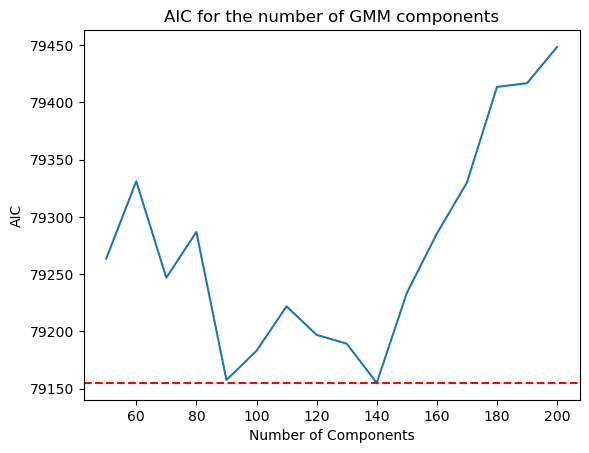

MinMaxScaler() / 140 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


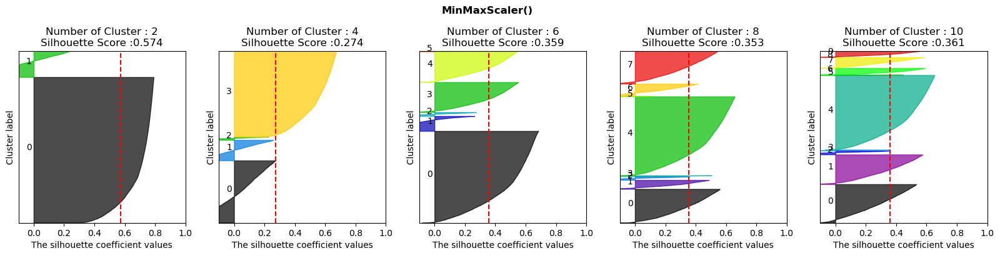

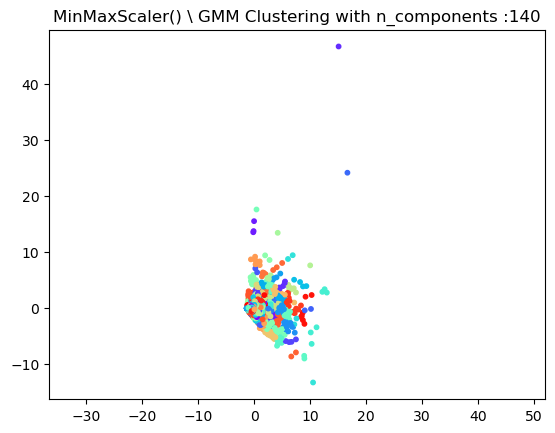

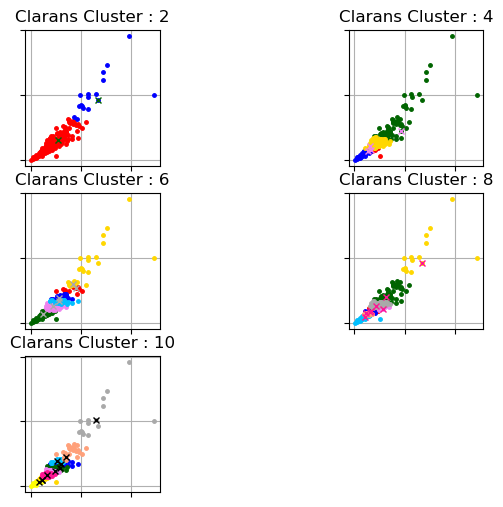

Clarans Silhouette Best score : 0.8893227127383503
Clarans Silhouette Best cluster : 3


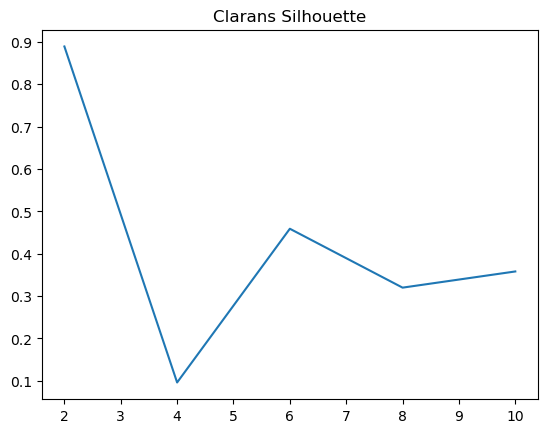

Clarans Best cluster's Elbow WCE : 48.334569031734


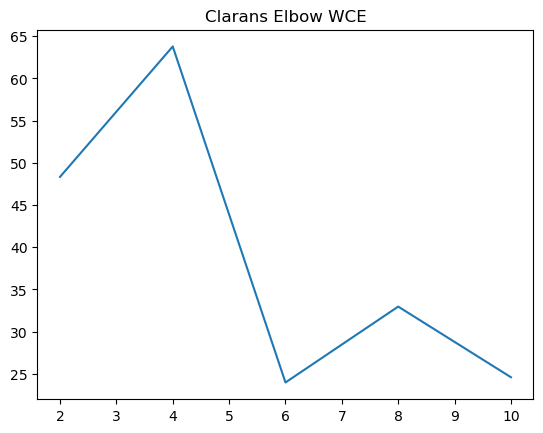

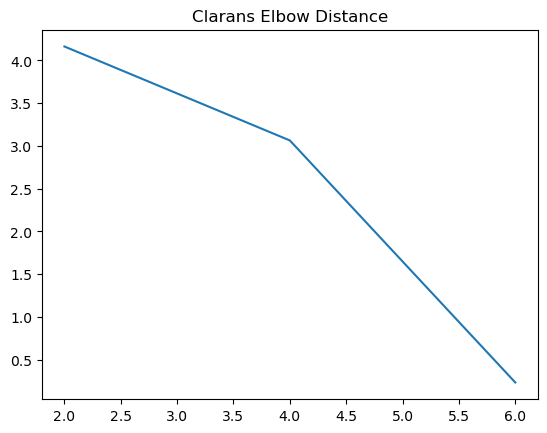

[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.7356
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8919
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.9308


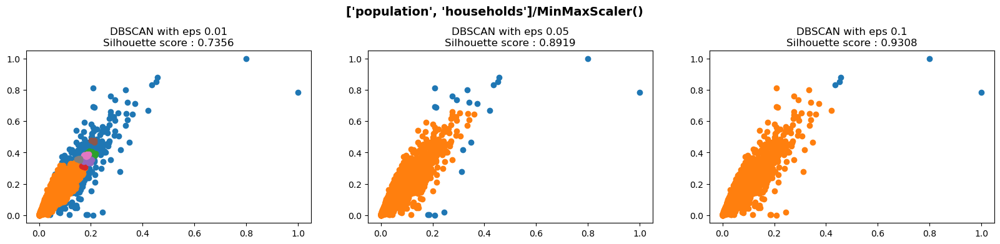

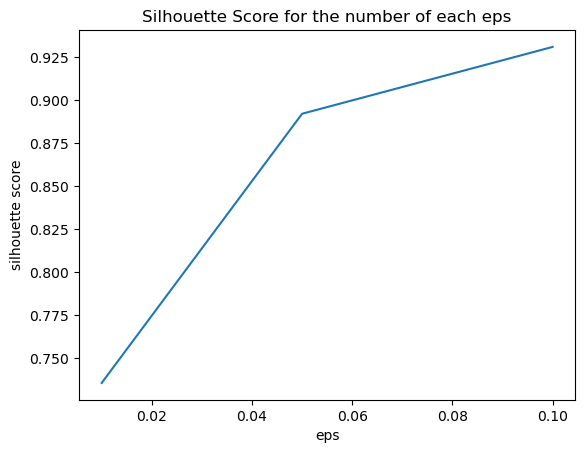

----------------RobustScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


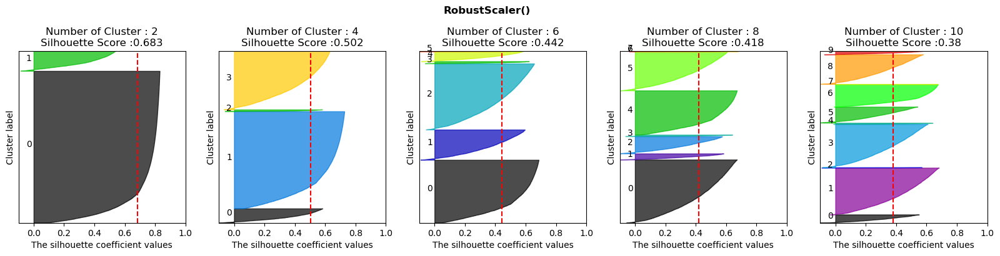

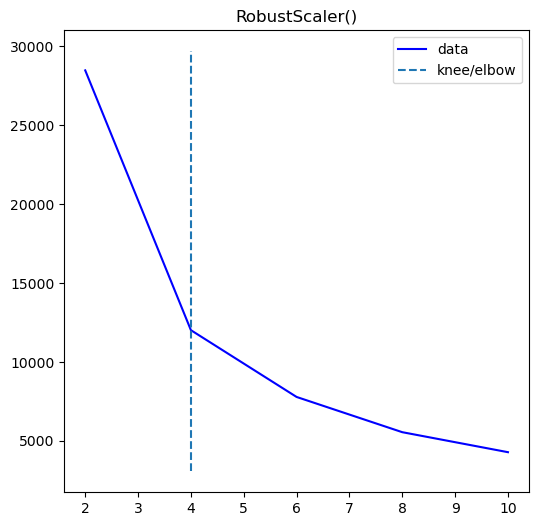

elbow: 4


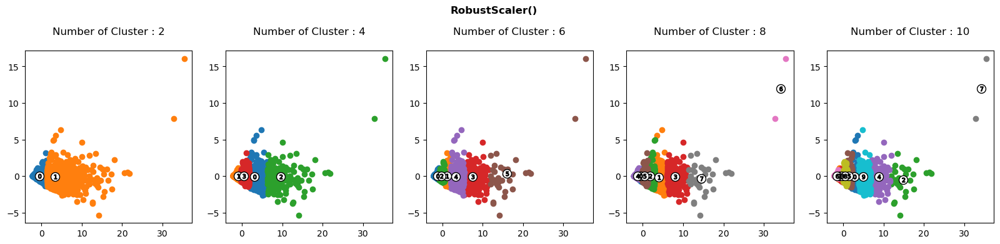

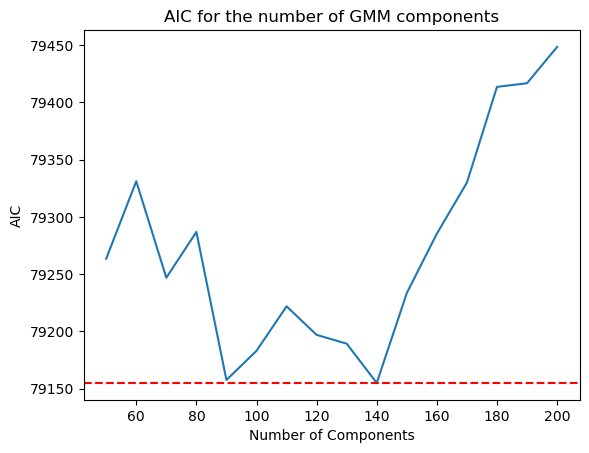

RobustScaler() / 140 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


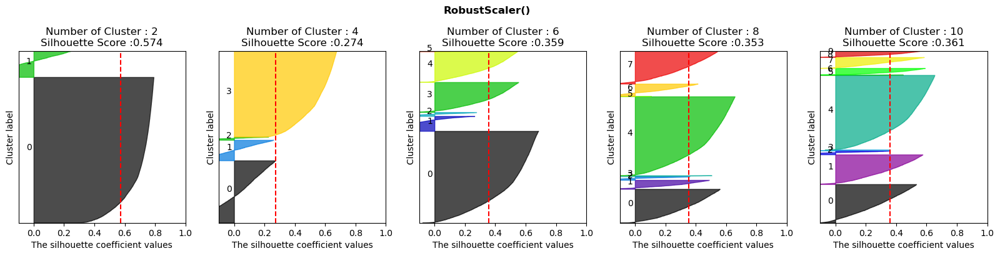

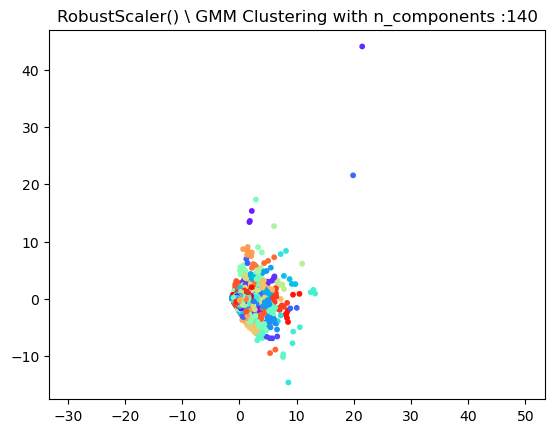

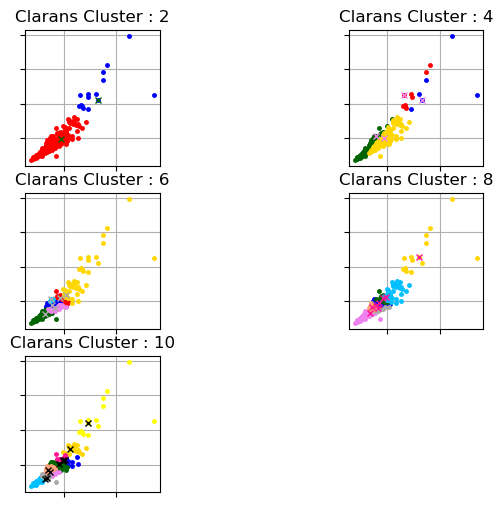

Clarans Silhouette Best score : 0.8923572479159009
Clarans Silhouette Best cluster : 3


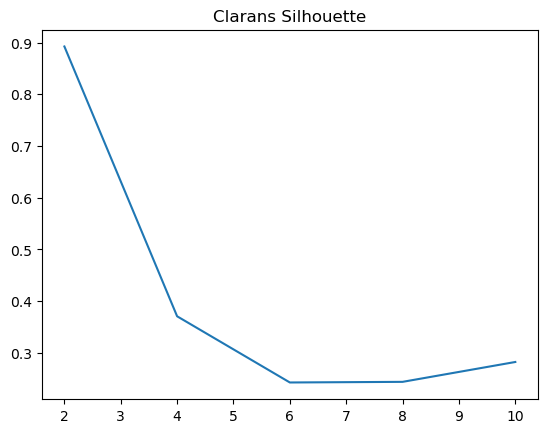

Clarans Best cluster's Elbow WCE : 28485.122839097843


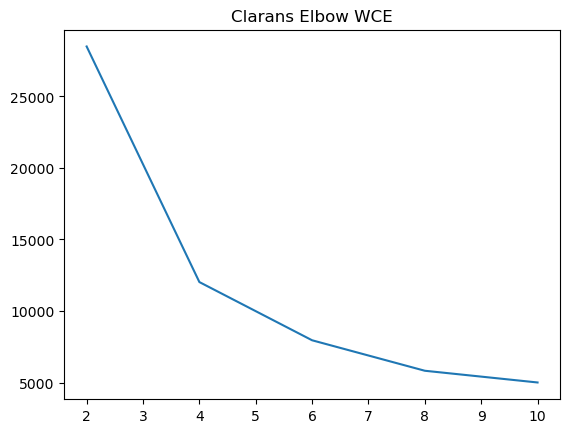

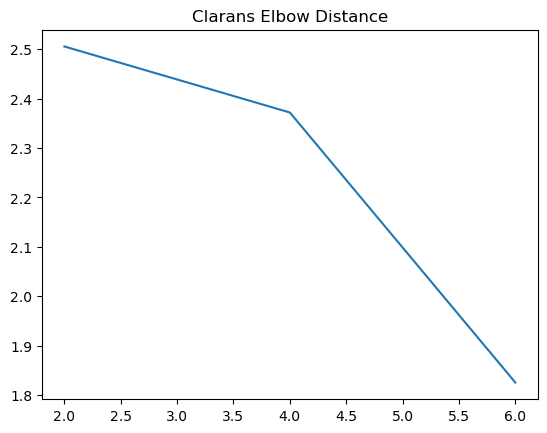

[  0  -1   1 ...  -1 293 193]
Silhouette Coefficient: -0.5547
[0 2 0 ... 0 0 0]
Silhouette Coefficient: -0.0628
[0 0 0 ... 0 0 0]
Silhouette Coefficient: -0.2172


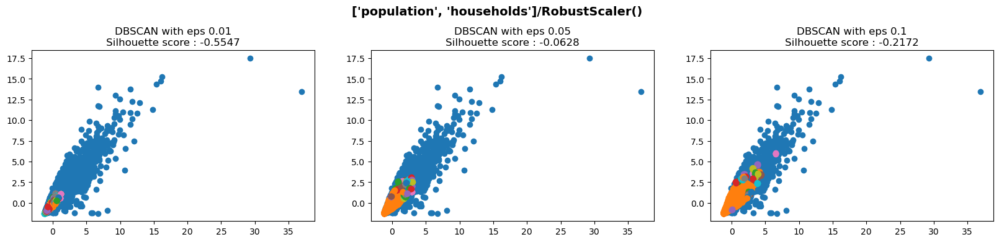

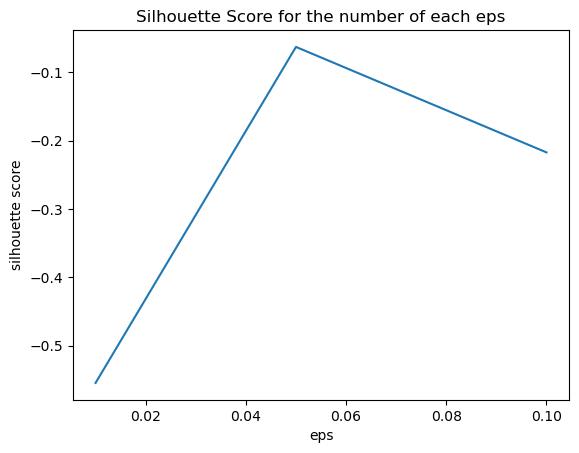

----------------['total_rooms', 'total_bedrooms', 'households']------------
----------------StandardScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


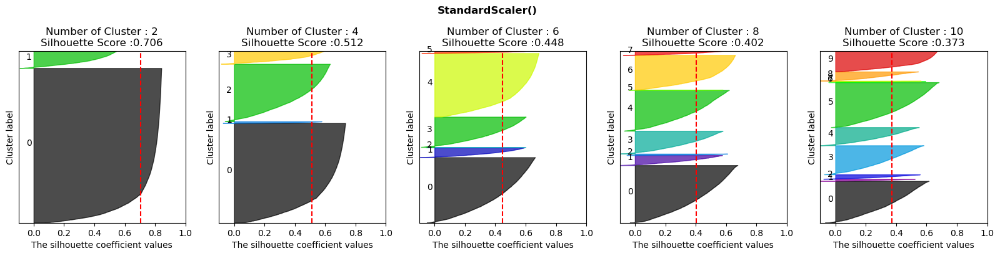

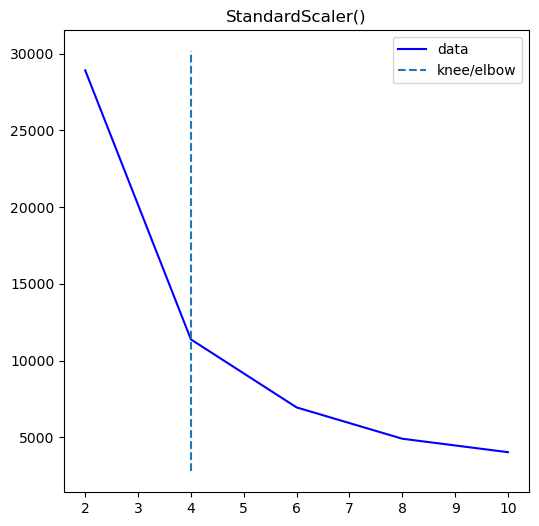

elbow: 4


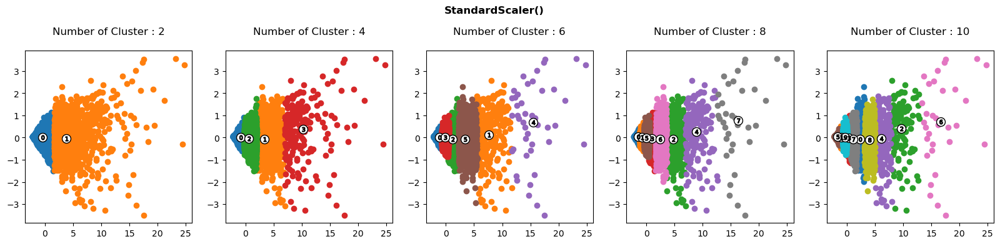

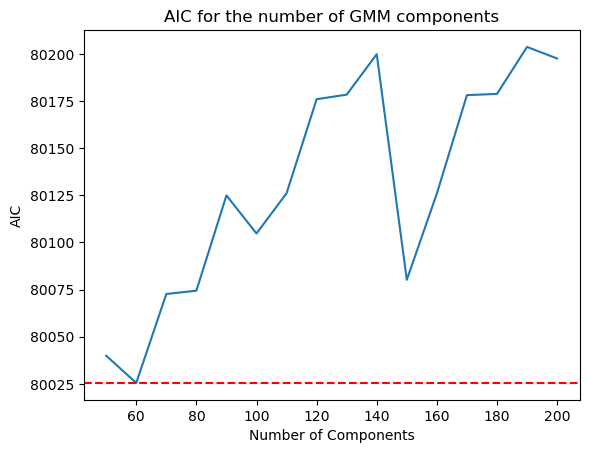

StandardScaler() / 60 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


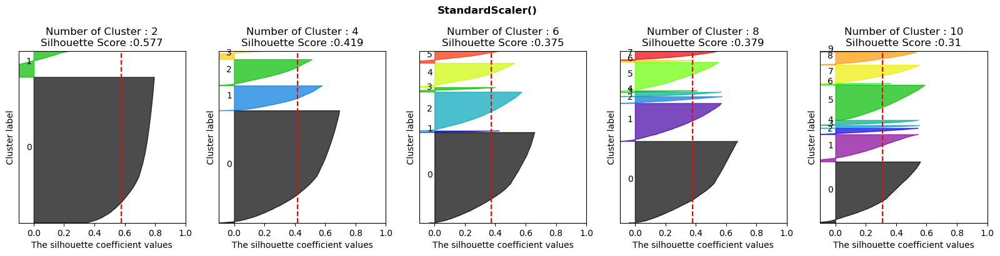

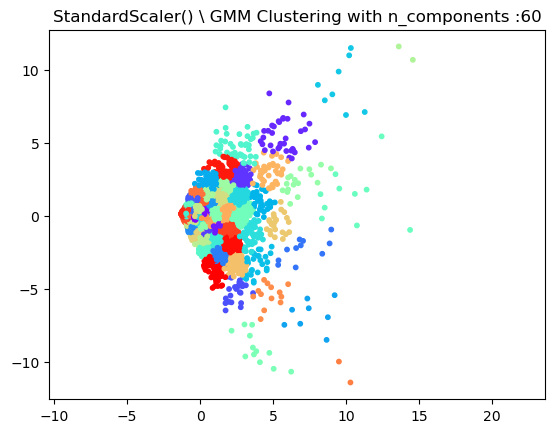

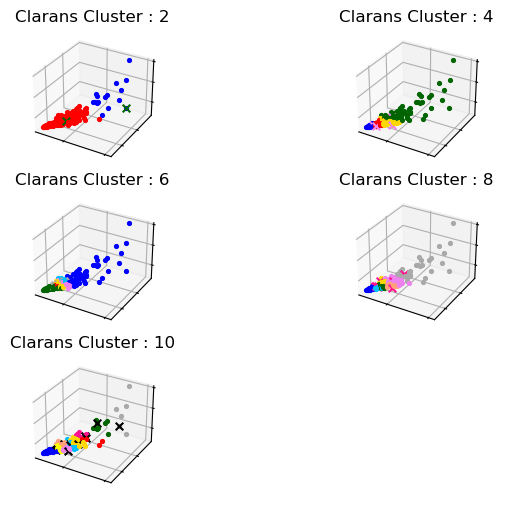

Clarans Silhouette Best score : 0.8885386144049527
Clarans Silhouette Best cluster : 3


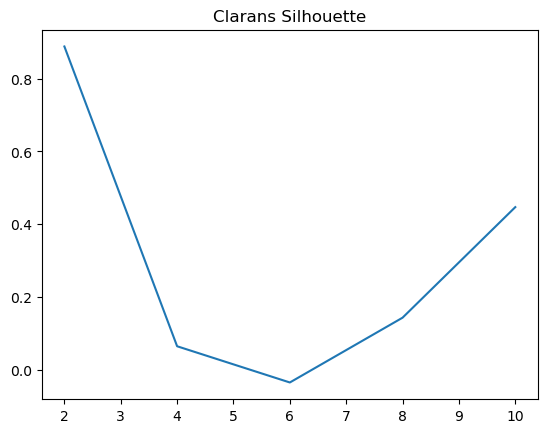

Clarans Best cluster's Elbow WCE : 28913.185874107046


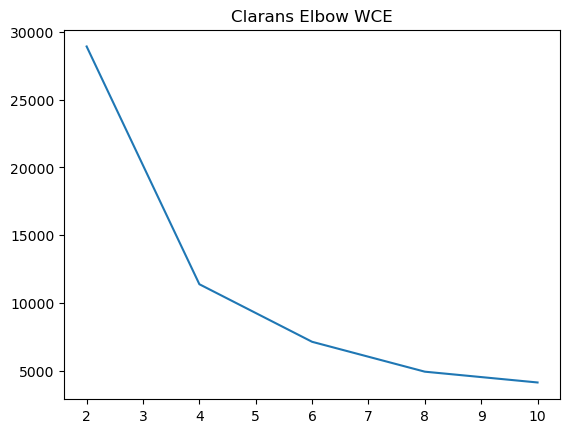

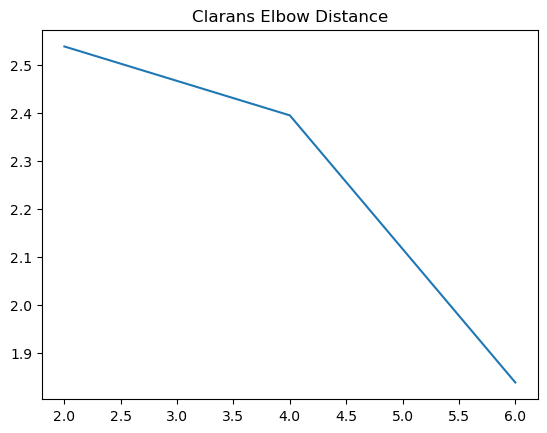

[-1 -1 -1 ... -1 -1 -1]
Silhouette Coefficient: -0.5787
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.6317
[0 0 0 ... 0 0 0]
Silhouette Coefficient: -0.4791


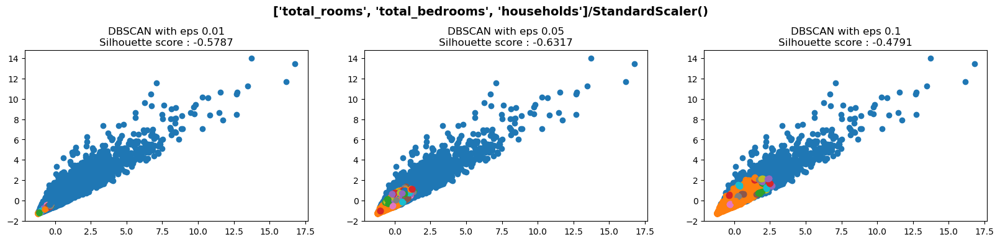

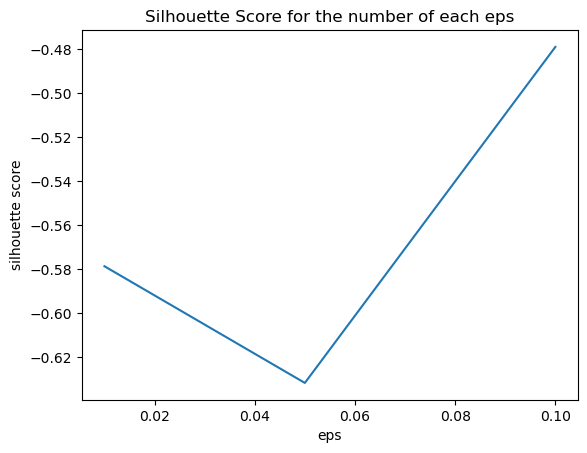

----------------MaxAbsScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


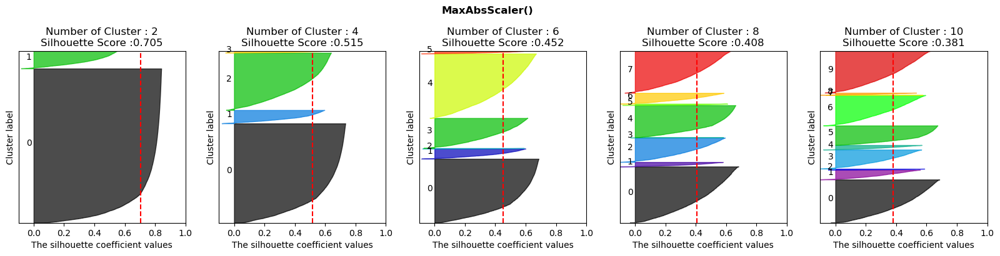

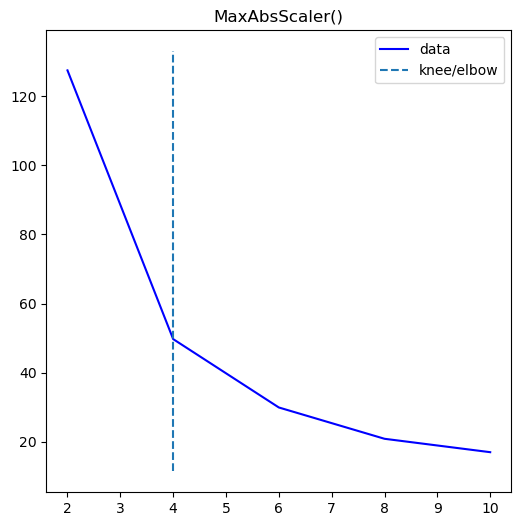

elbow: 4


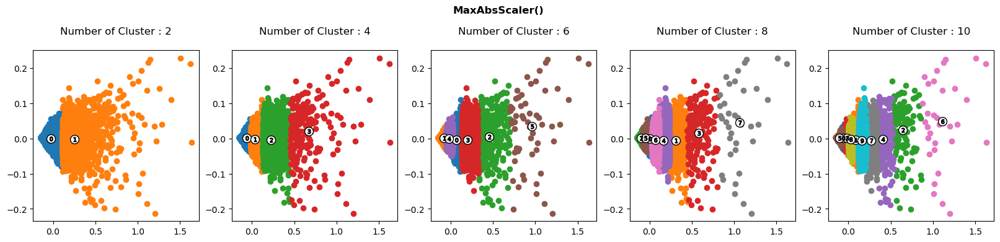

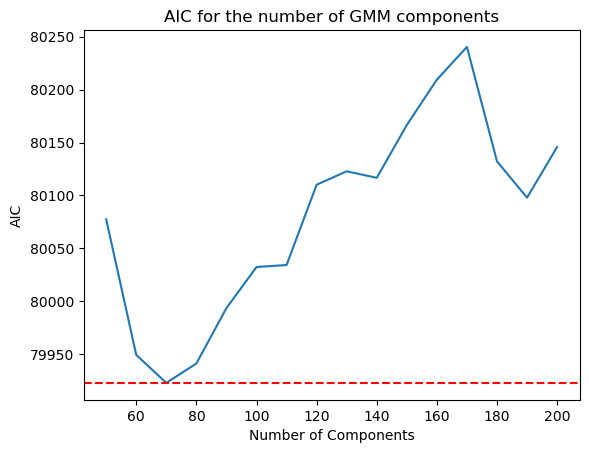

MaxAbsScaler() / 70 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


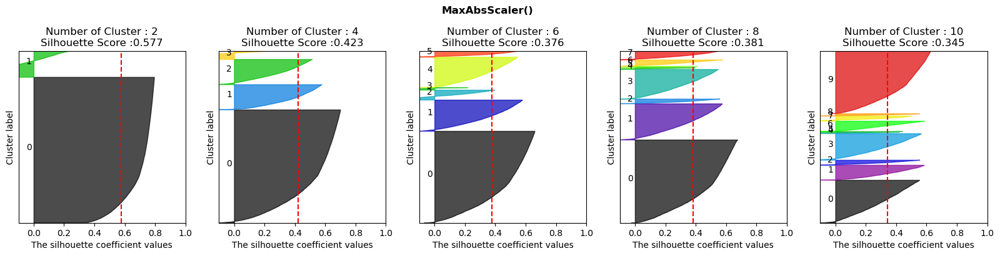

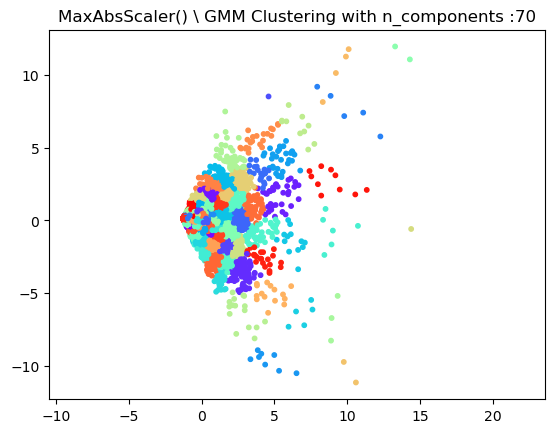

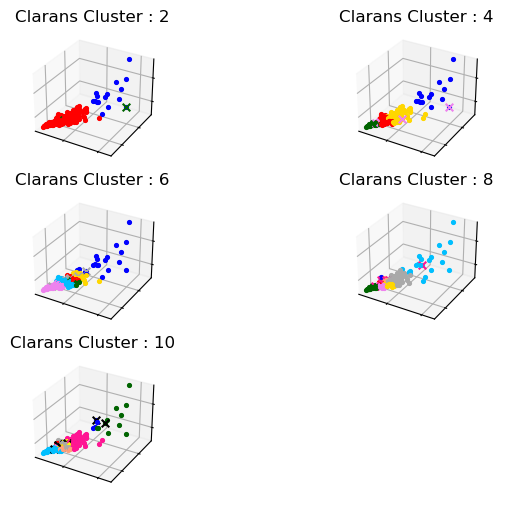

Clarans Silhouette Best score : 0.8909316206996806
Clarans Silhouette Best cluster : 3


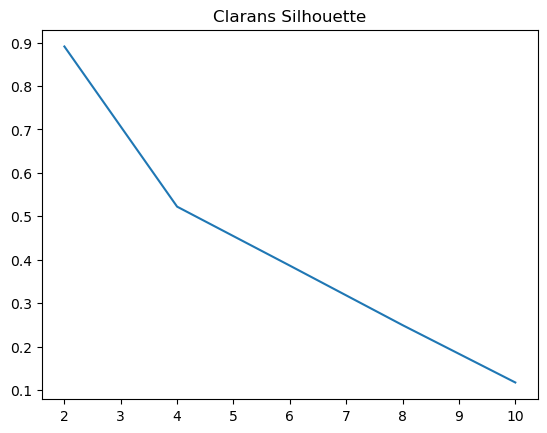

Clarans Best cluster's Elbow WCE : 128.76658786499533


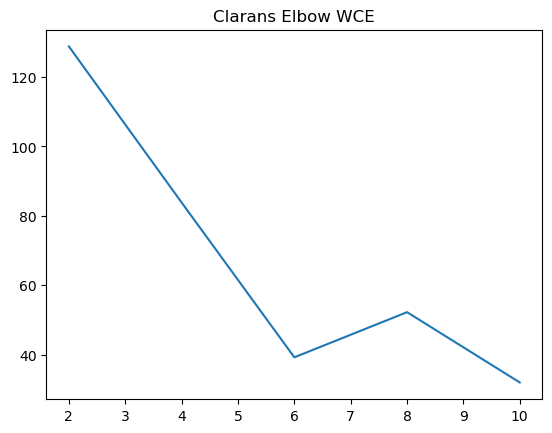

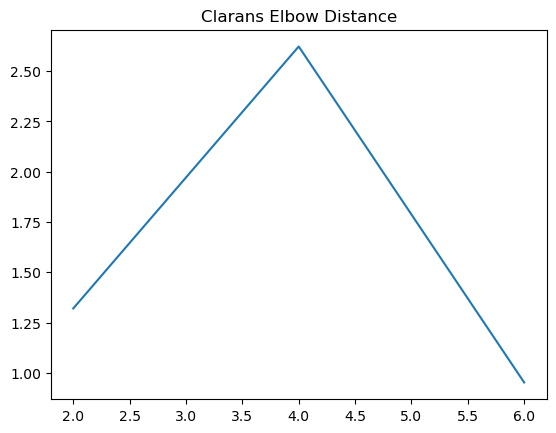

[0 0 0 ... 0 0 0]
Silhouette Coefficient: -0.1012
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8496
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8970


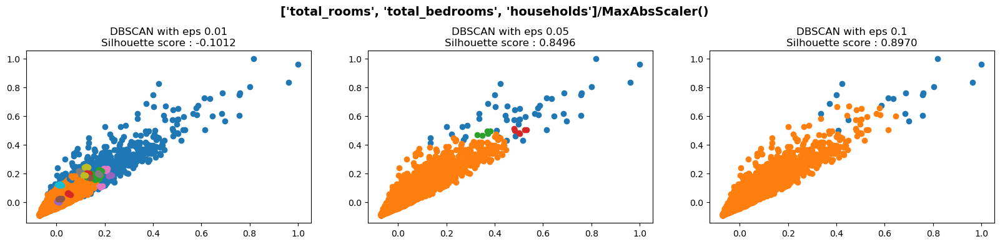

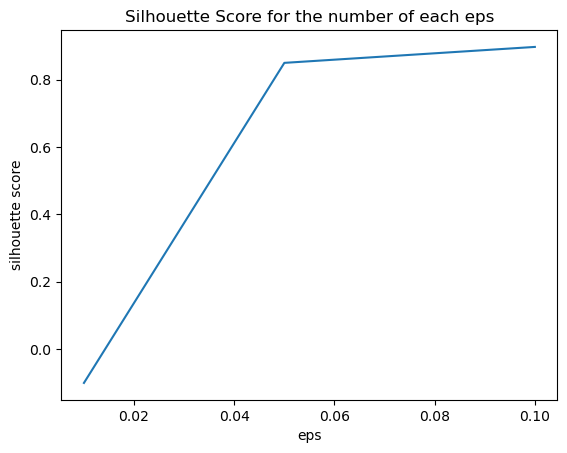

----------------MinMaxScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


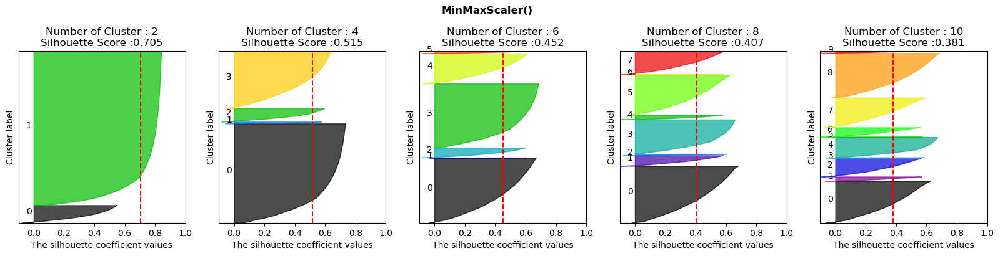

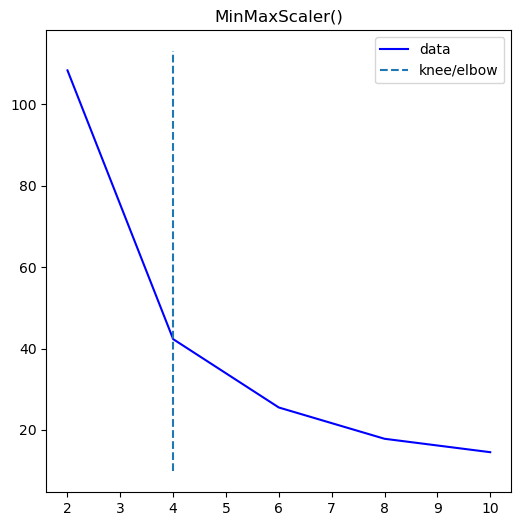

elbow: 4


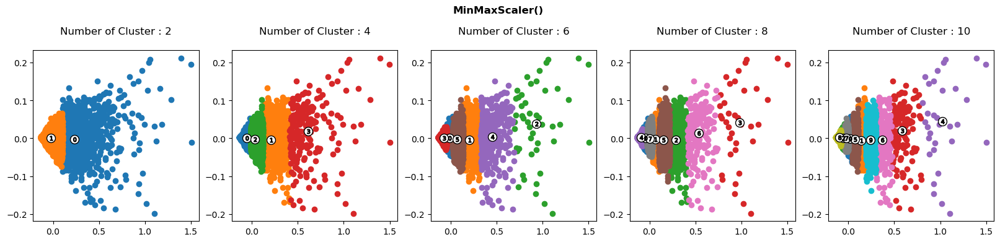

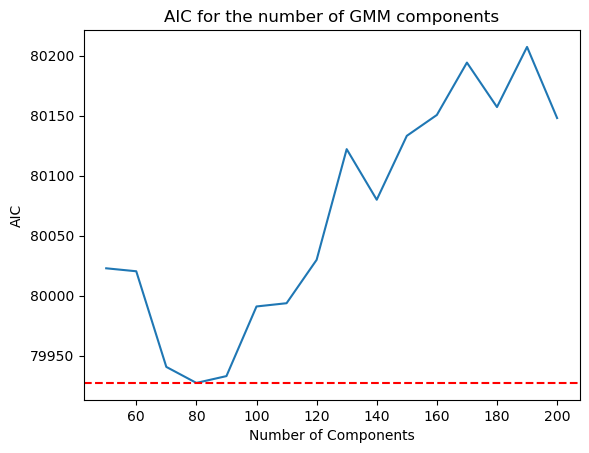

MinMaxScaler() / 80 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


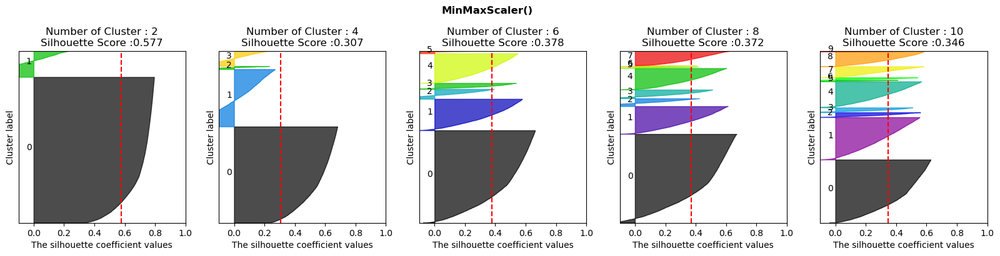

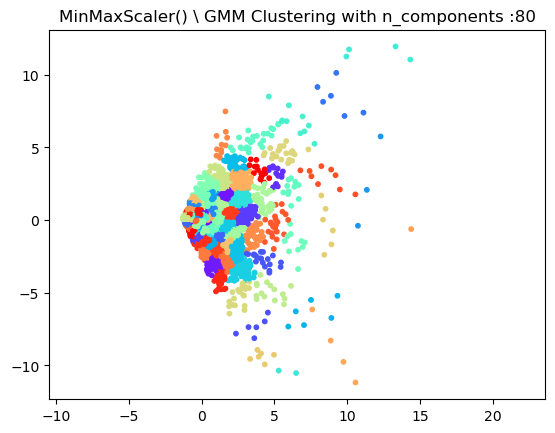

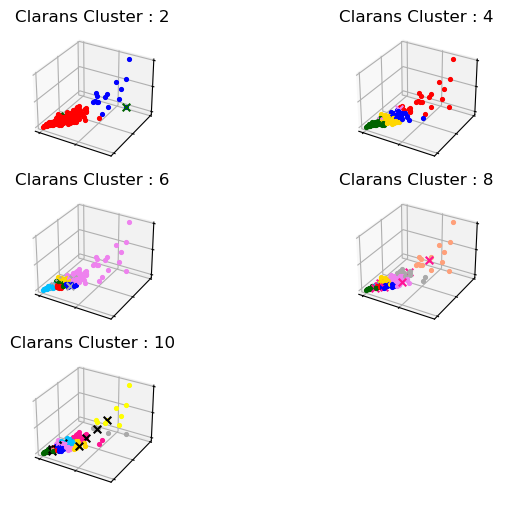

Clarans Silhouette Best score : 0.8907054291335339
Clarans Silhouette Best cluster : 3


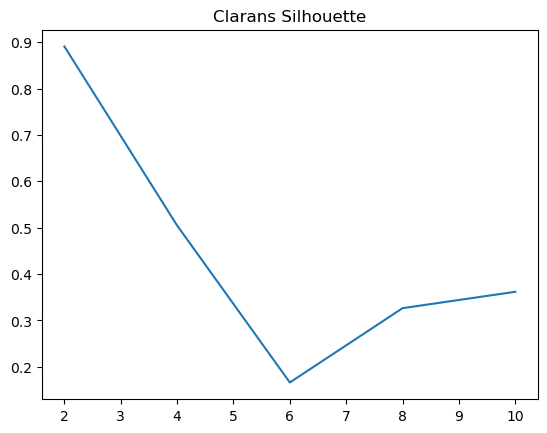

Clarans Best cluster's Elbow WCE : 108.85997831210285


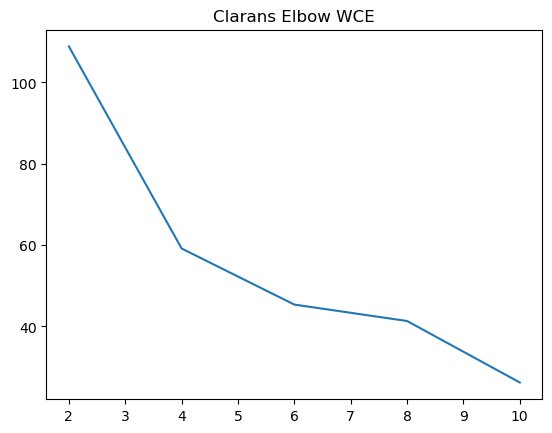

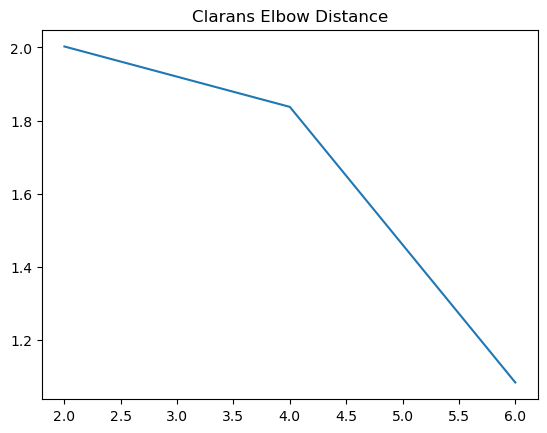

[0 0 0 ... 0 0 0]
Silhouette Coefficient: -0.1164
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8495
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.9023


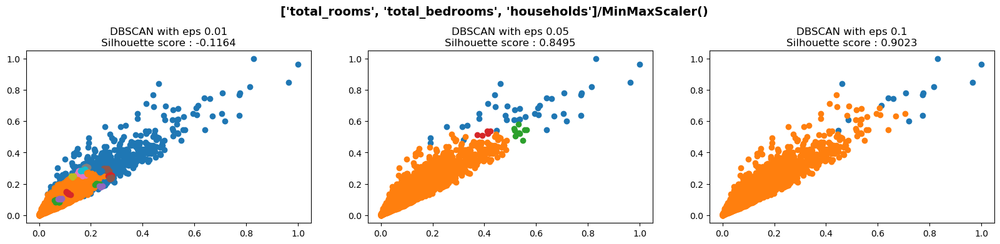

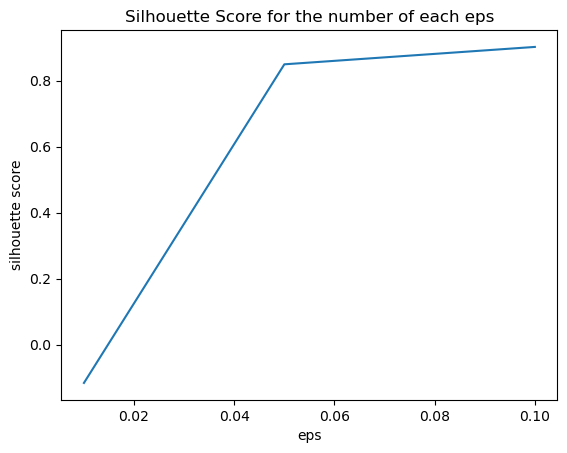

----------------RobustScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


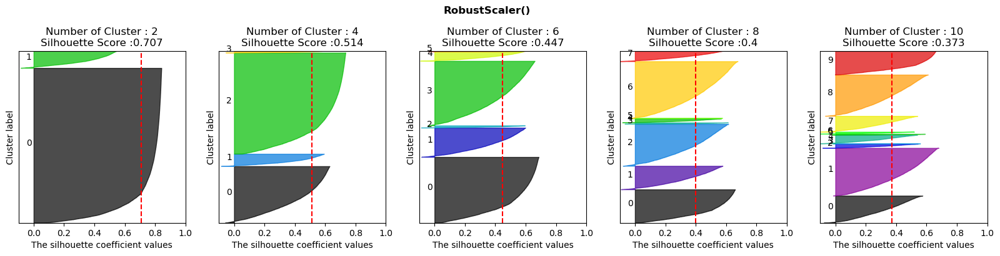

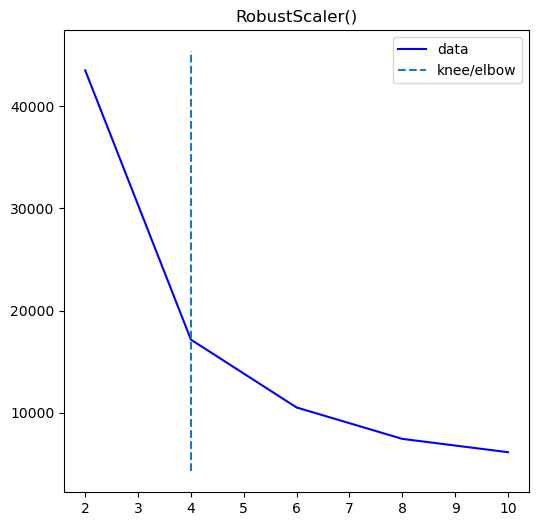

elbow: 4


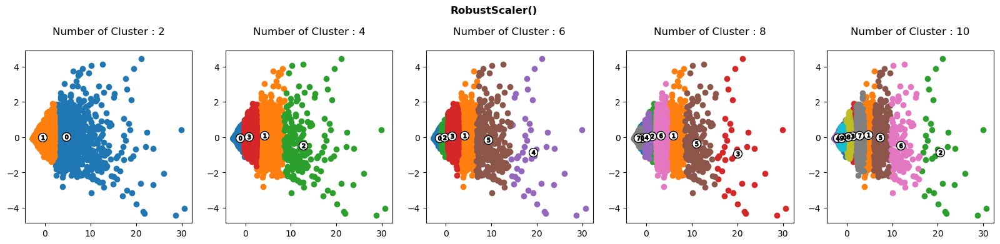

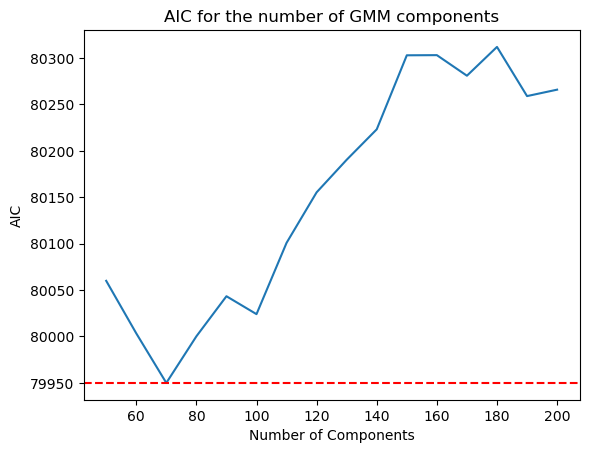

RobustScaler() / 70 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


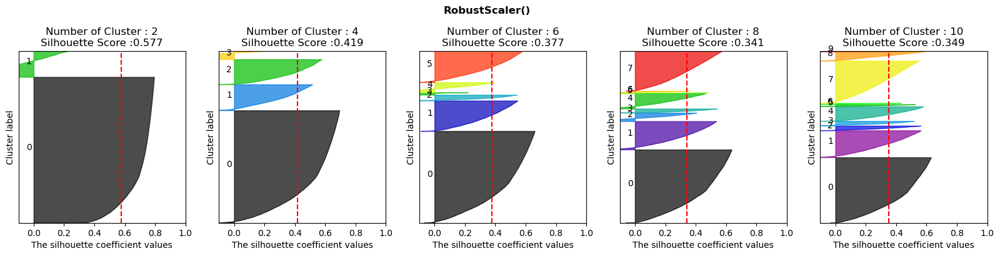

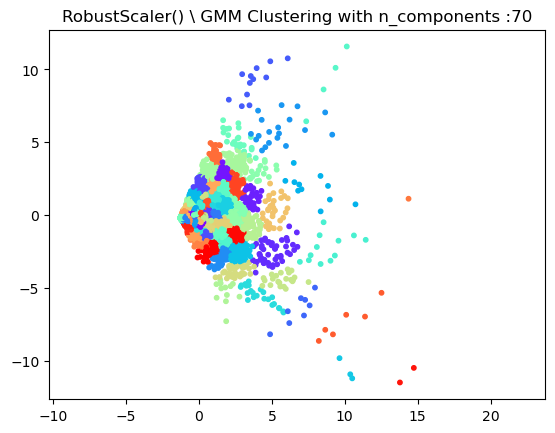

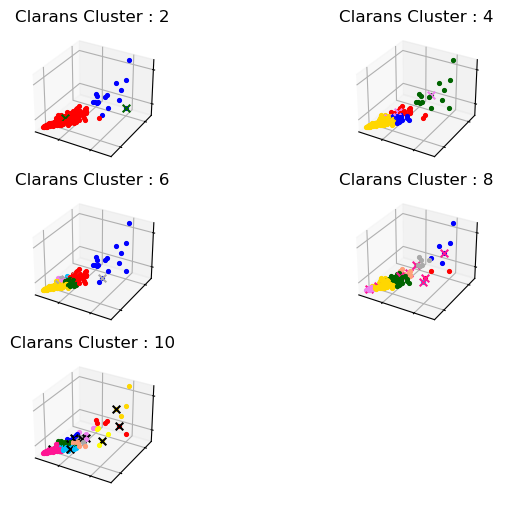

Clarans Silhouette Best score : 0.8869979630069654
Clarans Silhouette Best cluster : 3


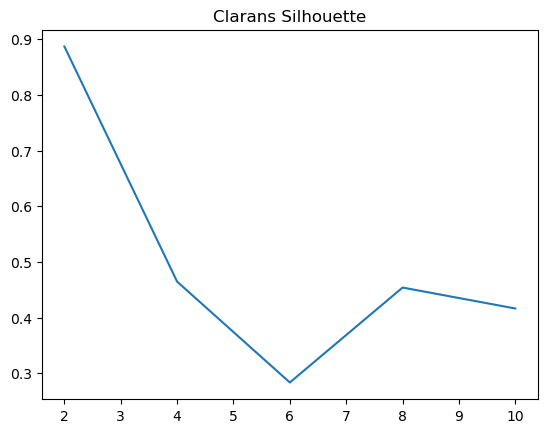

Clarans Best cluster's Elbow WCE : 43488.17997223945


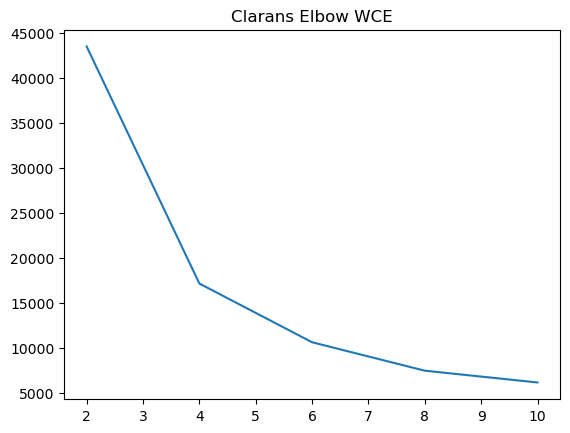

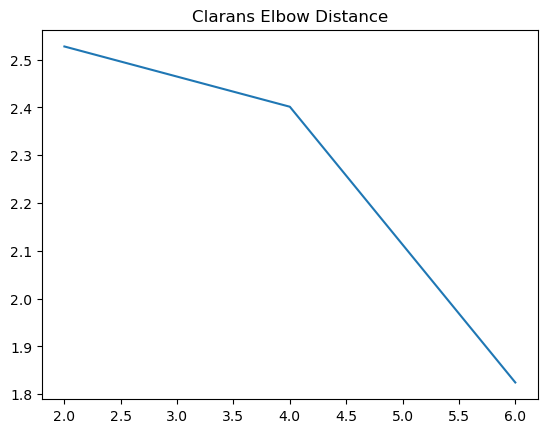

[-1 -1 -1 ... -1 -1 -1]
Silhouette Coefficient: -0.4111
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.6596
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.1047


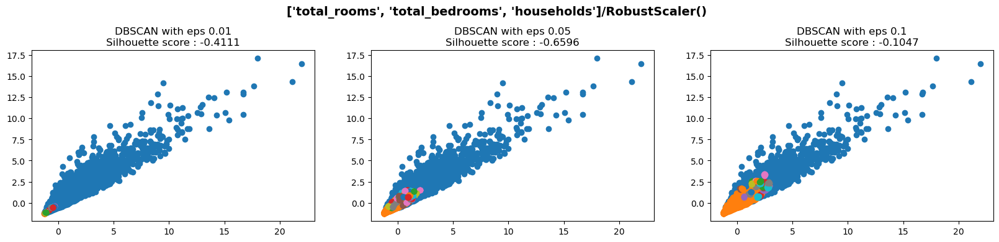

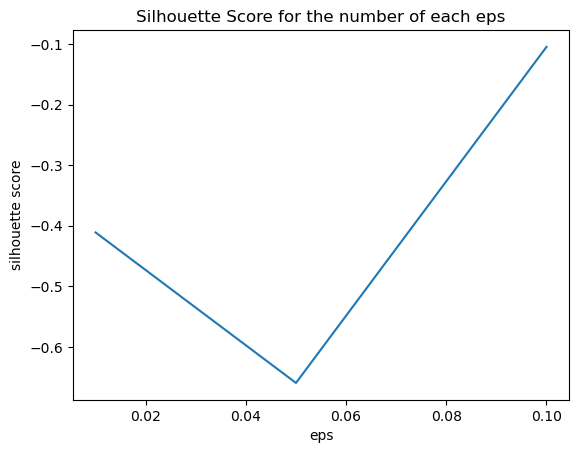

----------------['total_rooms', 'total_bedrooms', 'households', 'population']------------
----------------StandardScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


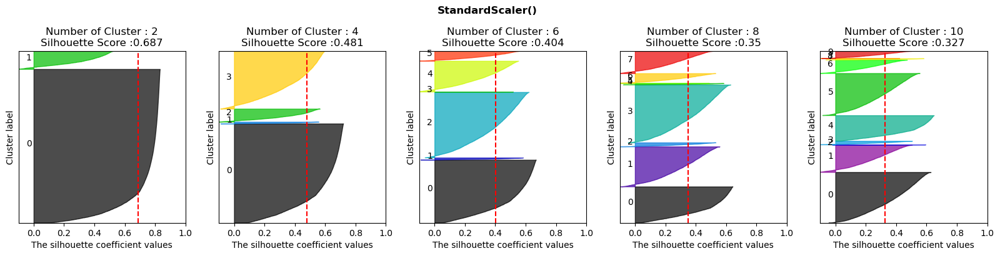

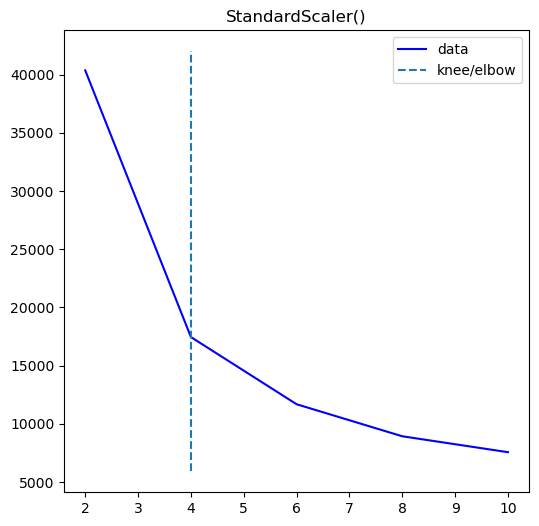

elbow: 4


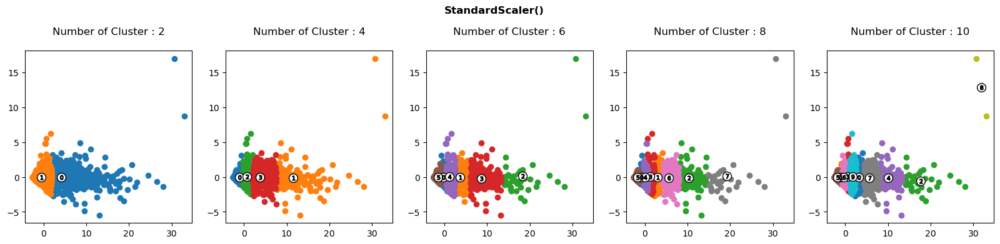

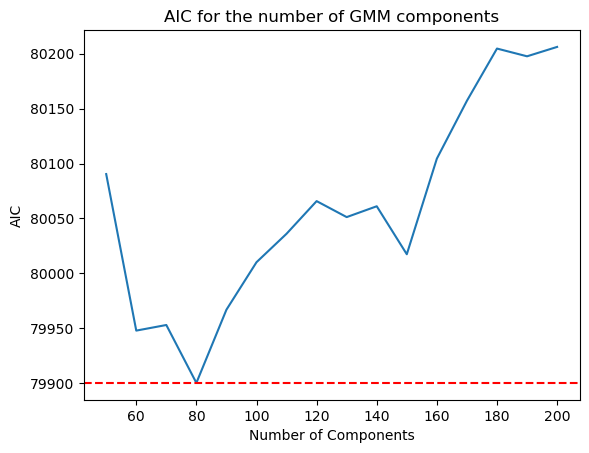

StandardScaler() / 80 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


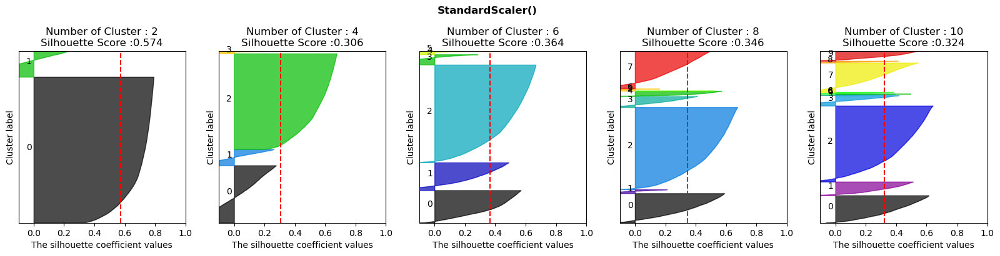

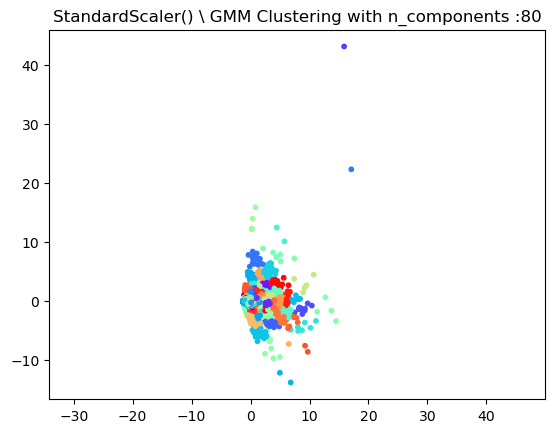

Clarans Silhouette Best score : 0.8655316080067744
Clarans Silhouette Best cluster : 3


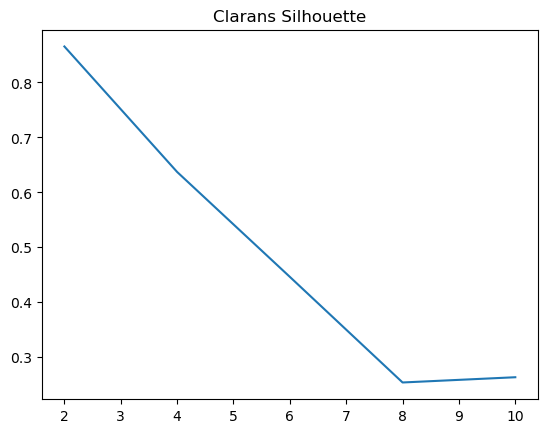

Clarans Best cluster's Elbow WCE : 40359.92175210009


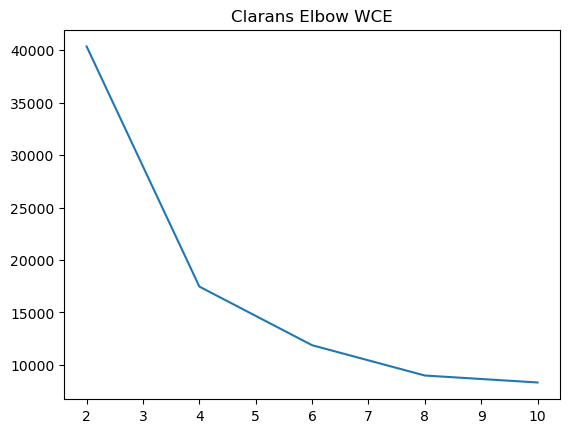

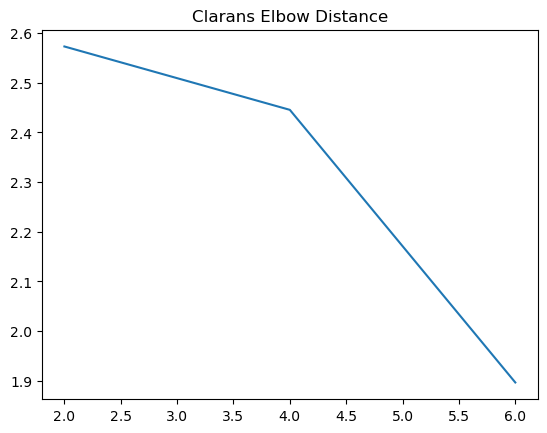

[-1 -1 -1 ... -1 -1 -1]
Silhouette Coefficient: 0.1369
[ 0 -1  0 ...  0 -1 -1]
Silhouette Coefficient: -0.6478
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.3904


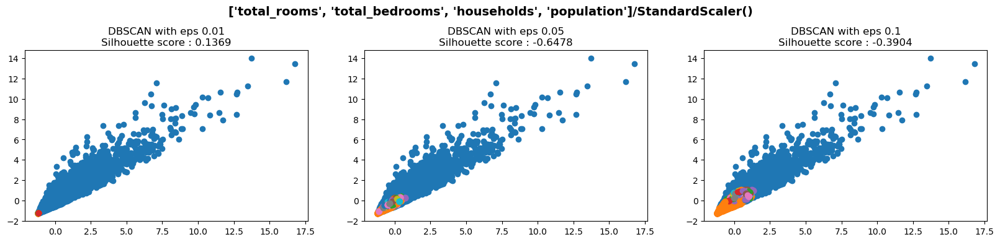

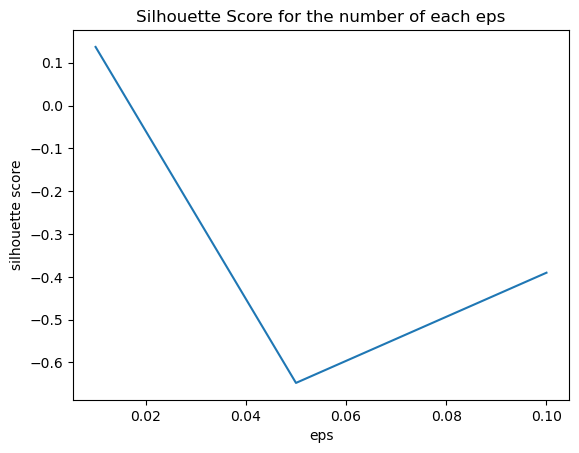

----------------MaxAbsScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


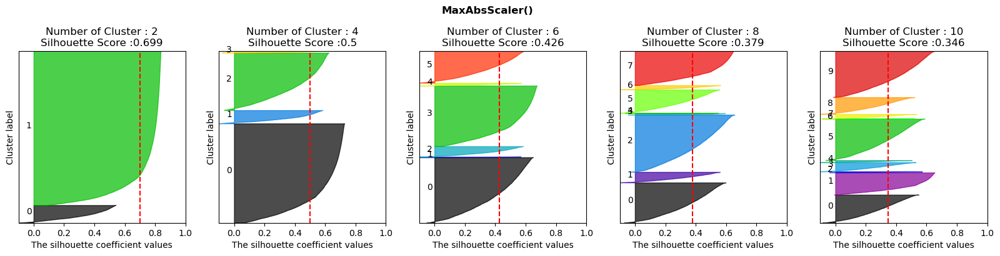

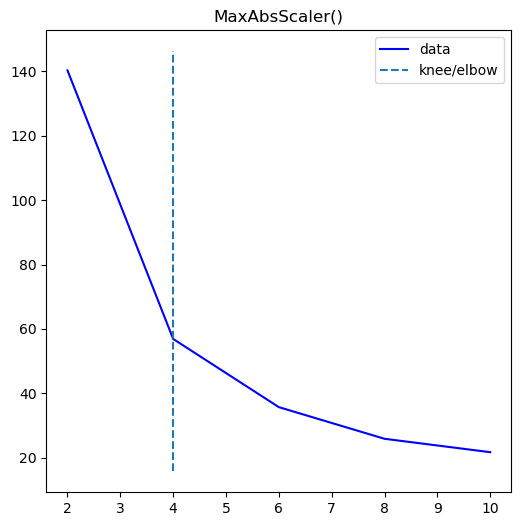

elbow: 4


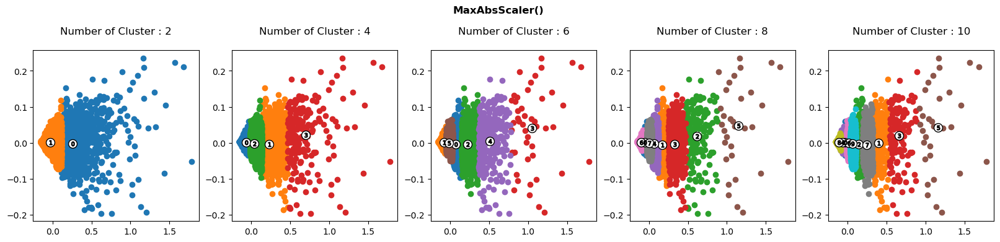

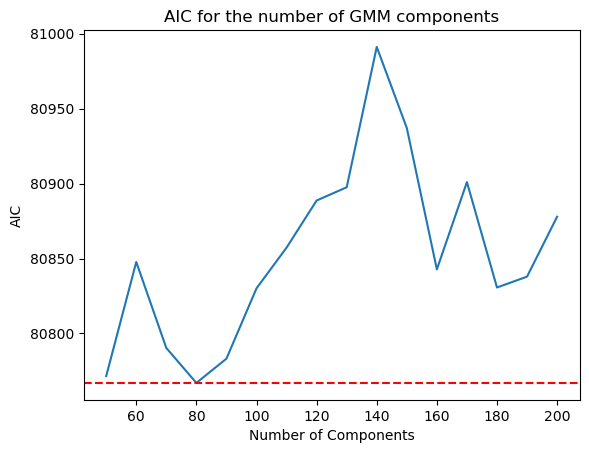

MaxAbsScaler() / 80 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


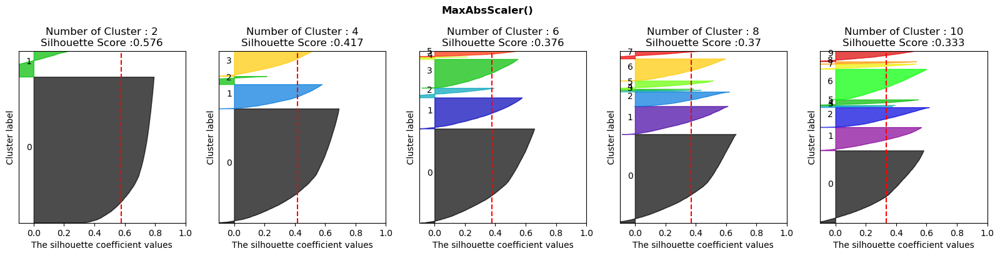

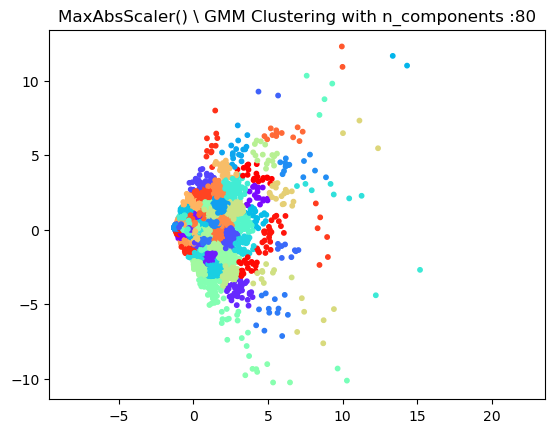

Clarans Silhouette Best score : 0.8836218060063107
Clarans Silhouette Best cluster : 3


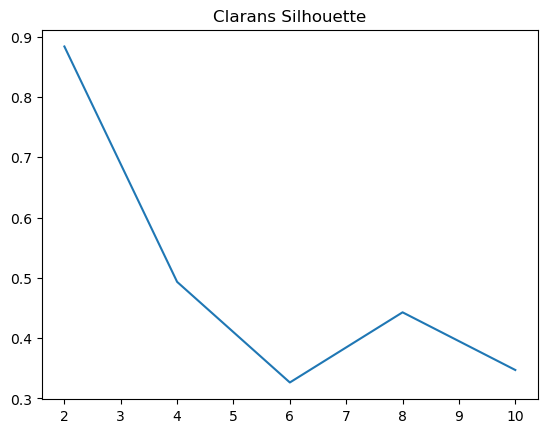

Clarans Best cluster's Elbow WCE : 142.0046556508625


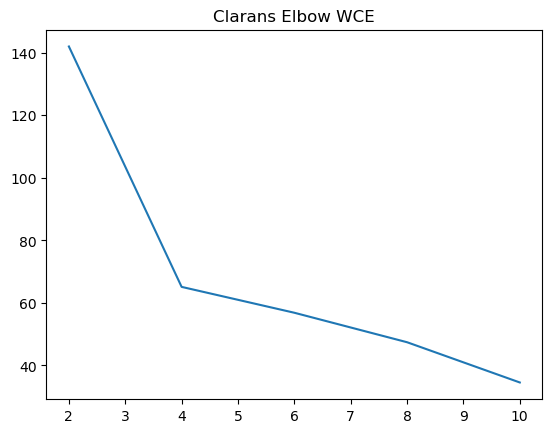

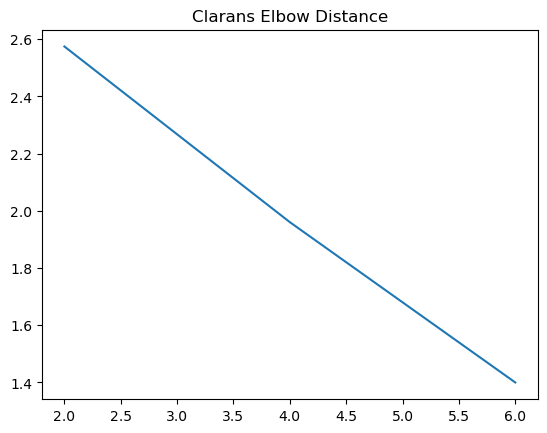

[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.3312
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8517
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8958


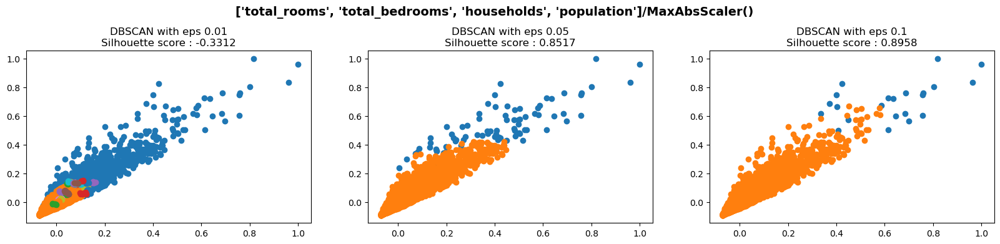

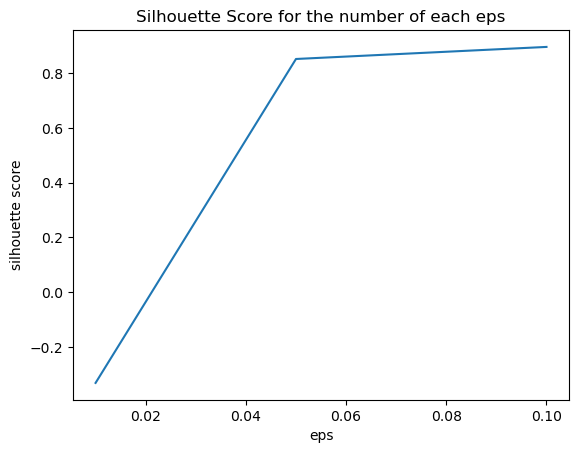

----------------MinMaxScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


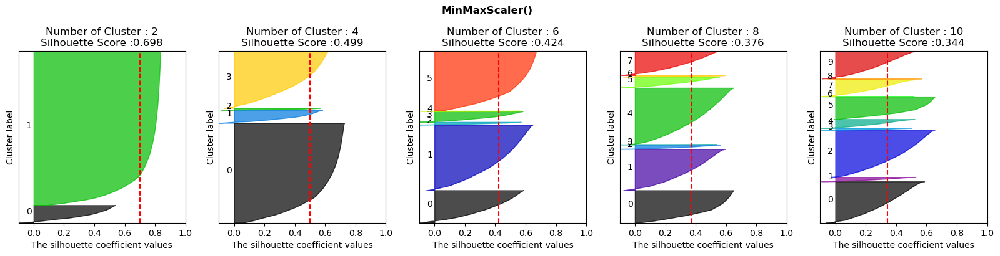

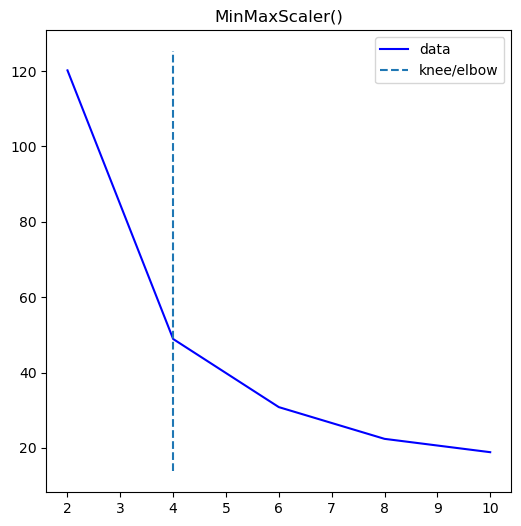

elbow: 4


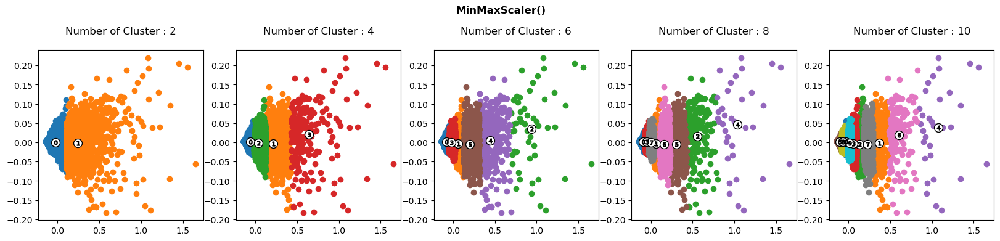

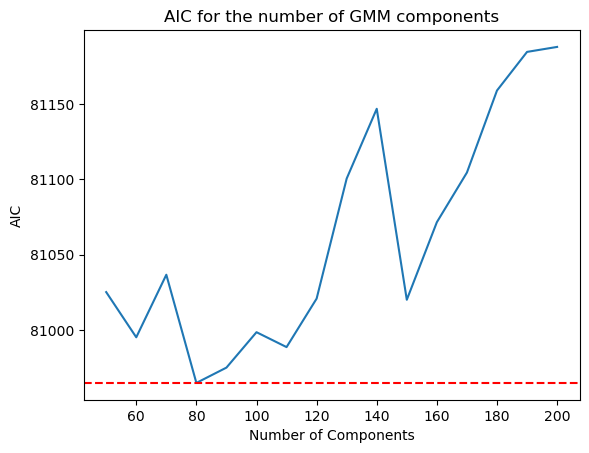

MinMaxScaler() / 80 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


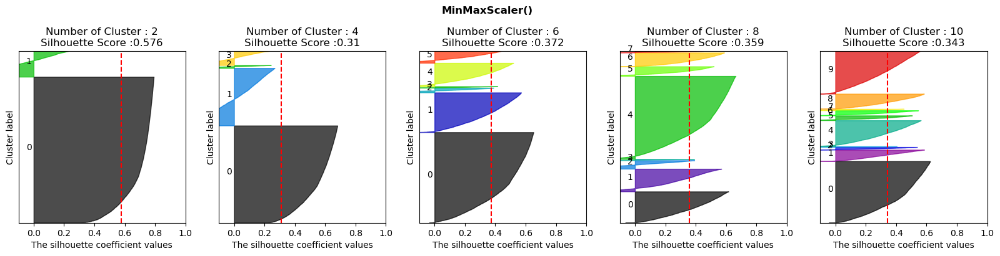

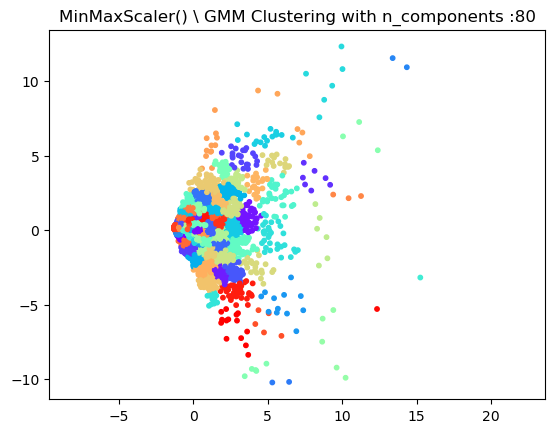

Clarans Silhouette Best score : 0.8889644182642918
Clarans Silhouette Best cluster : 3


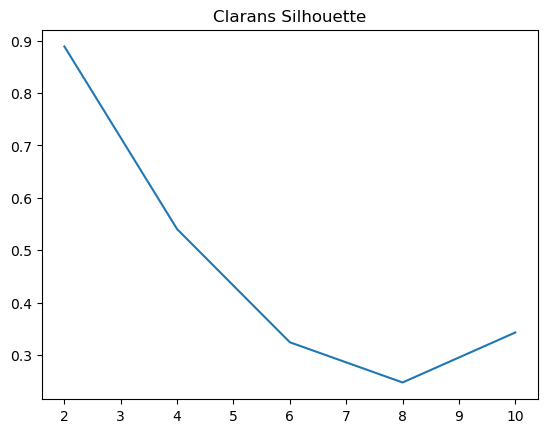

Clarans Best cluster's Elbow WCE : 121.390170774485


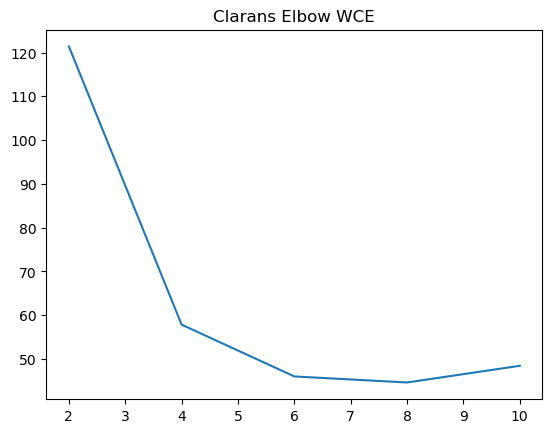

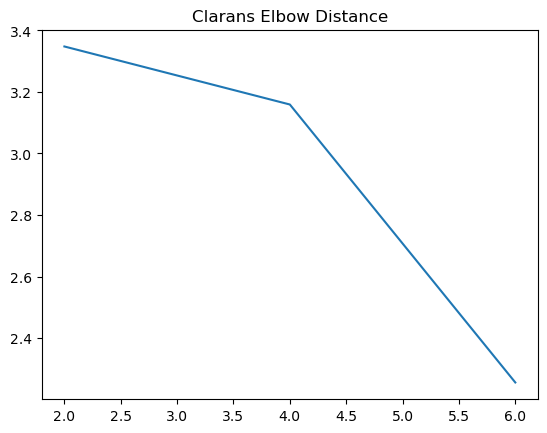

[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.0824
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8540
[0 0 0 ... 0 0 0]
Silhouette Coefficient: 0.8996


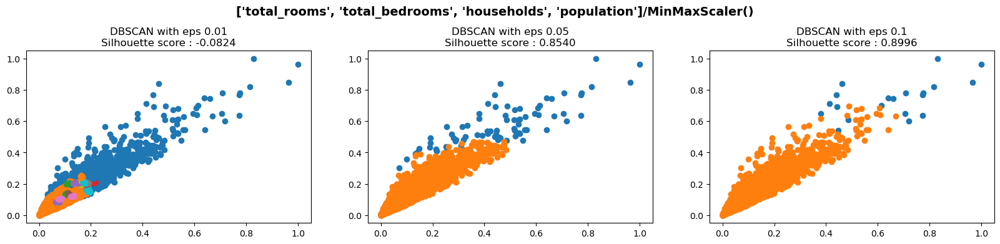

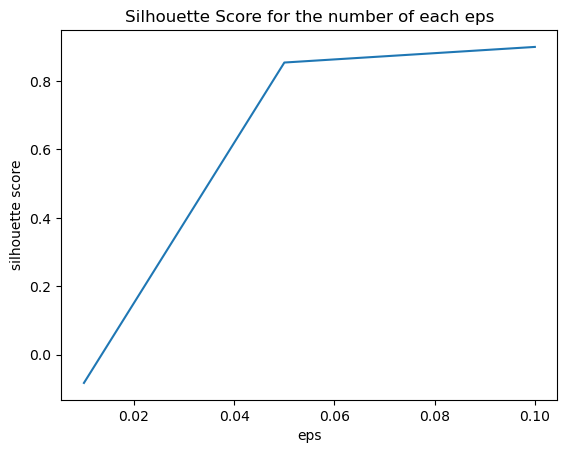

----------------RobustScaler()------------
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


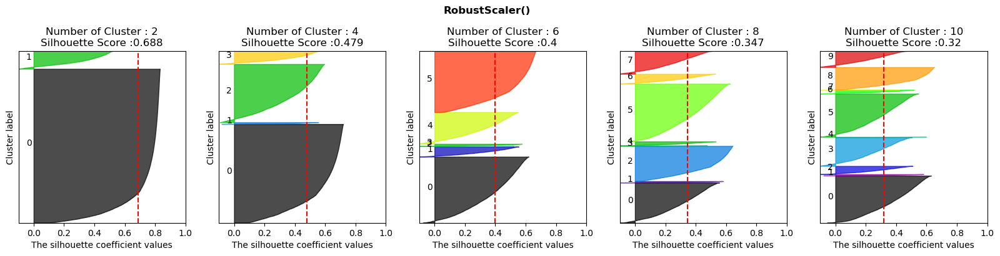

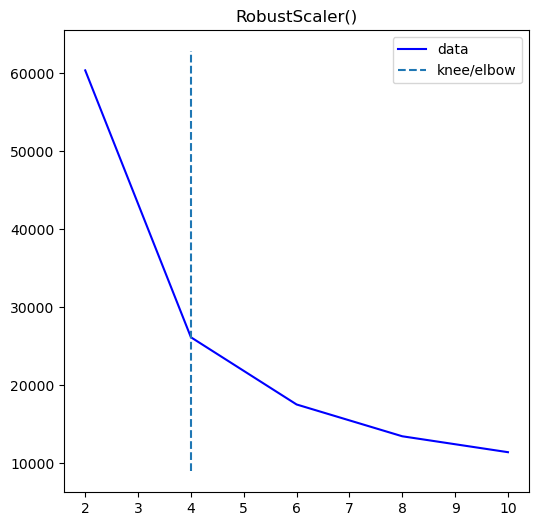

elbow: 4


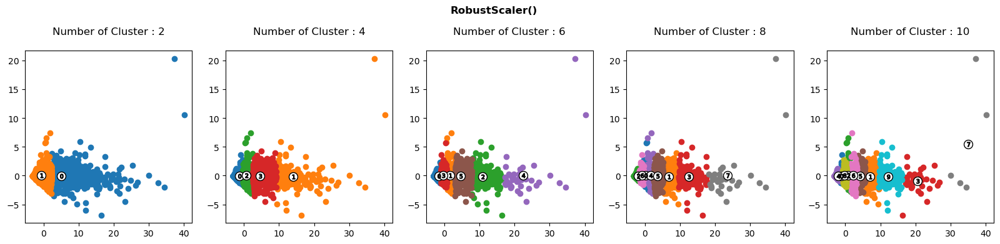

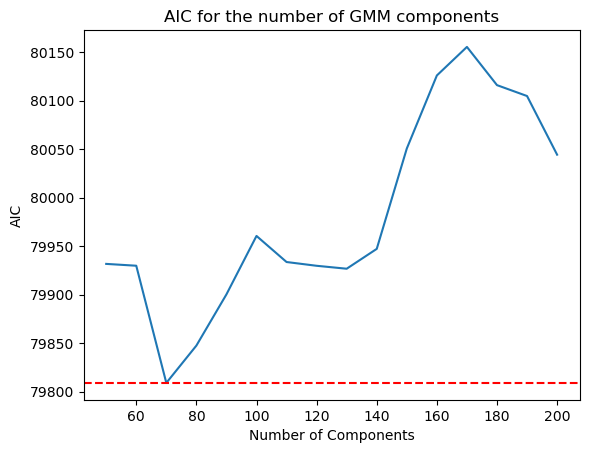

RobustScaler() / 70 Converged : True
[Running] : 20.00%
[Running] : 40.00%
[Running] : 60.00%
[Running] : 80.00%
[Running] : 100.00%


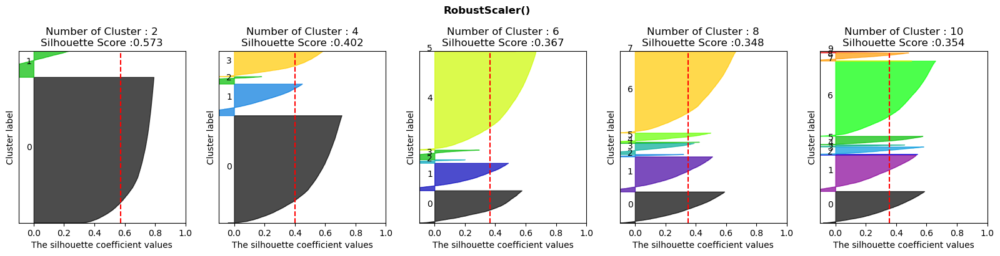

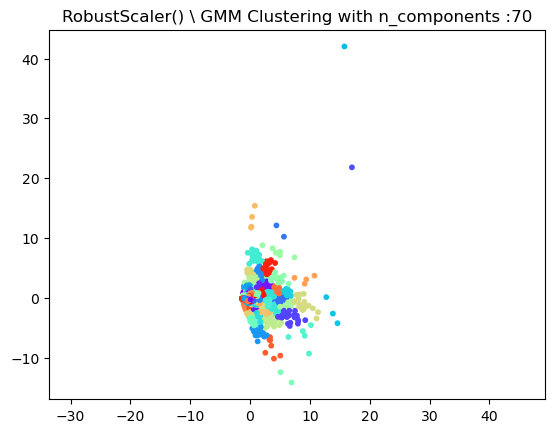

Clarans Silhouette Best score : 0.8743227671841126
Clarans Silhouette Best cluster : 3


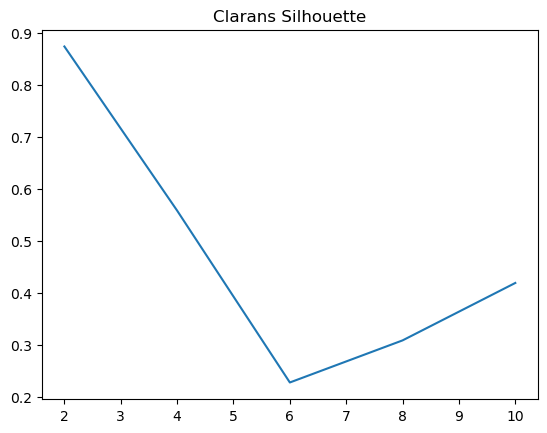

Clarans Best cluster's Elbow WCE : 60344.42597717403


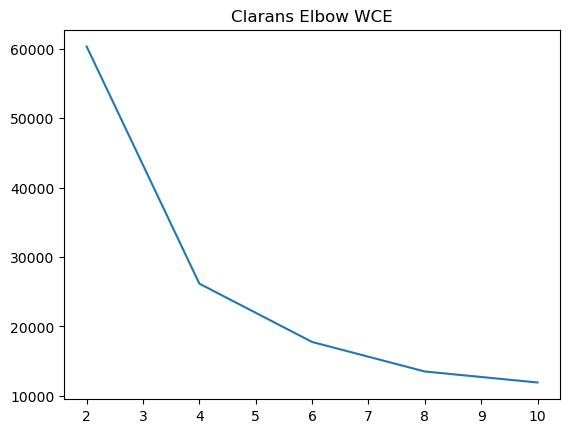

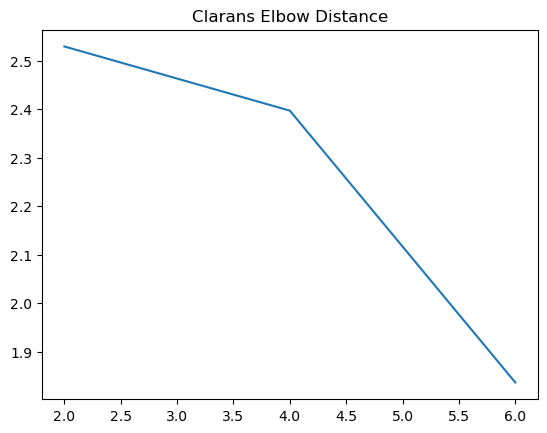

[-1 -1 -1 ... -1 -1 -1]
Silhouette Coefficient: 0.1625
[ 0 -1  1 ... 15 -1 -1]
Silhouette Coefficient: -0.6707
[ 0 -1  0 ...  0  0  0]
Silhouette Coefficient: -0.3261


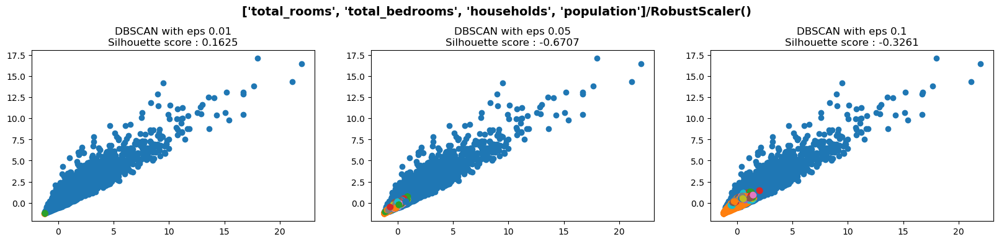

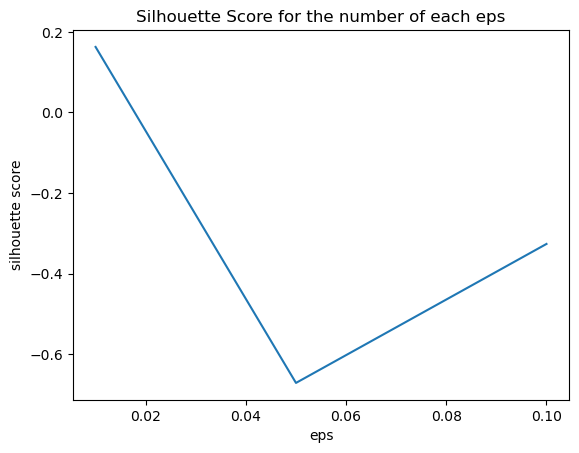

In [8]:
# Set feature sets
predictor=[['total_rooms', 'total_bedrooms'],
           ['population', 'households'],
           ['total_rooms', 'total_bedrooms', 'households'],
           ['total_rooms', 'total_bedrooms', 'households','population']]

# Set scaler lists
scalers = [StandardScaler(), MaxAbsScaler(), MinMaxScaler(), RobustScaler()]

# Iterate over feature sets and scalers
for i in predictor:
    print('----------------{}------------'.format(i))
    select_df = df[i]

    for j in scalers:
        print('----------------{}------------'.format(j))
        select_df = j.fit_transform(select_df)

        kmeans_silhouette_eblow(range(2, 11, 2), select_df, j)
        gmm_cluster(select_df, j)
        clustering_clarans(select_df)
        findOptimalNClustersDB(select_df)
